# **CUSTOMER SEGMENTATION PROJECT**

In [1]:
# https://www.kaggle.com/datasets/imakash3011/customer-personality-analysis

### Description Text:

# Importing Libraries:

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn import metrics
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans ,AgglomerativeClustering

import datetime
import sys
import warnings
warnings.filterwarnings('ignore')

In [3]:
from yellowbrick.cluster import KElbowVisualizer

In [4]:
from mpl_toolkits.mplot3d import Axes3D

In [5]:
import scipy.cluster.hierarchy as sch # for plotting dendrogram

In [6]:
from sklearn.cluster import DBSCAN

In [7]:
from matplotlib.colors import ListedColormap # creating custom cmap

In [8]:
from sklearn.metrics import silhouette_score, davies_bouldin_score

In [9]:
from sklearn.model_selection import train_test_split

In [10]:
from sklearn.model_selection import GridSearchCV

In [11]:
from sklearn.metrics import confusion_matrix, classification_report

In [12]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

In [13]:
from sklearn.ensemble import RandomForestClassifier

In [14]:
import joblib

# Loading Dataset

In [15]:
data = pd.read_csv('marketing_campaign.csv' , sep="\t")
data.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


In [16]:
pd.set_option('display.max_columns', None)

In [17]:
# there is no target/outcome feature, implying 
# this dataset cannot be used for supervised learning models

# Exploring Dataset (EDA)

In [18]:
data.shape

(2240, 29)

In [19]:
data.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response'],
      dtype='object')

In [20]:
data.ID.nunique()

2240

In [21]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [22]:
# Dt_Customer is not in datetime type

In [23]:
data.isnull().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

In [24]:
# income column has Nan values

# Data Cleaning

In [25]:
#dropping rows with Nan Values , which are very low in this dataset
data.dropna(inplace=True)
data.shape

(2216, 29)

In [26]:
# converting Dt_customer to datetime 
data['Dt_Customer'] = pd.to_datetime(data['Dt_Customer'] ,  format='%d-%m-%Y')

# Creating new Features

In [27]:
# "Customer_For" no. of days customers started to shop using Dt_Customer
# findining most recent date in data:
dates = [date for date in data.Dt_Customer]
print('maxdate: ',max(dates),', min date: ', min(dates))

maxdate:  2014-06-29 00:00:00 , min date:  2012-07-30 00:00:00


In [28]:
data['Customer_For'] = max(dates) - data['Dt_Customer']
data['Customer_For'] = data['Customer_For'].dt.days
data['Customer_For'] = data['Customer_For'].astype(int)

In [29]:
# analysing categorical variables
data.Education.value_counts()

Education
Graduation    1116
PhD            481
Master         365
2n Cycle       200
Basic           54
Name: count, dtype: int64

In [30]:
data.Marital_Status.value_counts()

Marital_Status
Married     857
Together    573
Single      471
Divorced    232
Widow        76
Alone         3
Absurd        2
YOLO          2
Name: count, dtype: int64

In [31]:
# feature Age from Year_Birth
data['Age'] = 2014 - data['Year_Birth'] # 2014 is latest date in dataset
data.Age

0       57
1       60
2       49
3       30
4       33
        ..
2235    47
2236    68
2237    33
2238    58
2239    60
Name: Age, Length: 2216, dtype: int64

In [32]:
# feature Spent for total spendings
data["Spent"] = (data["MntWines"]+ data["MntFruits"]+ 
                    data["MntMeatProducts"]+ data["MntFishProducts"]+ 
                        data["MntSweetProducts"]+ data["MntGoldProds"])
data["Spent"]

0       1617
1         27
2        776
3         53
4        422
        ... 
2235    1341
2236     444
2237    1241
2238     843
2239     172
Name: Spent, Length: 2216, dtype: int64

In [33]:
# new feature Living_With into only 2 categories: Partner or Alone
data["Living_With"]=data["Marital_Status"].replace({
    "Married":"Partner", 
    "Together":"Partner", 
    "Absurd":"Alone", 
    "Widow":"Alone", 
    "YOLO":"Alone", 
    "Divorced":"Alone", 
    "Single":"Alone",})
data.Living_With.unique()

array(['Alone', 'Partner'], dtype=object)

In [34]:
# feature Children = sum of Teenage, Kids
data["Children"]=data["Kidhome"]+data["Teenhome"]

In [35]:
#Feature Family_Size
data["Family_Size"] = data["Living_With"].replace({"Alone": 1, "Partner":2})+ data["Children"]

In [36]:
#Feature Is_Parent =1 if yes , else 0 if not a parent
data["Is_Parent"] = np.where(data.Children> 0, 1, 0)

In [37]:
# Education categories: undergard/ postgrad
data["Education"]=data["Education"].replace({
    "Basic":"Undergraduate",
    "2n Cycle":"Undergraduate", 
    "Graduation":"Graduate", 
    "Master":"Postgraduate", 
    "PhD":"Postgraduate"})

In [38]:
data.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Customer_For,Age,Spent,Living_With,Children,Family_Size,Is_Parent
0,5524,1957,Graduate,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1,663,57,1617,Alone,0,1,0
1,2174,1954,Graduate,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0,113,60,27,Alone,2,3,1
2,4141,1965,Graduate,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0,312,49,776,Partner,0,2,0
3,6182,1984,Graduate,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0,139,30,53,Partner,1,3,1
4,5324,1981,Postgraduate,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0,161,33,422,Partner,1,3,1


In [39]:
data=data.rename(columns={"MntWines": "Wines",
                          "MntFruits":"Fruits",
                          "MntMeatProducts":"Meat",
                          "MntFishProducts":"Fish",
                          "MntSweetProducts":"Sweets",
                          "MntGoldProds":"Gold"})

In [40]:
# Dropping features no longer useful
to_drop = ["Marital_Status", "Dt_Customer", "Z_CostContact", "Z_Revenue", "Year_Birth", "ID"]
data = data.drop(to_drop, axis=1)

In [41]:
data.columns

Index(['Education', 'Income', 'Kidhome', 'Teenhome', 'Recency', 'Wines',
       'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold', 'NumDealsPurchases',
       'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases',
       'NumWebVisitsMonth', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',
       'AcceptedCmp1', 'AcceptedCmp2', 'Complain', 'Response', 'Customer_For',
       'Age', 'Spent', 'Living_With', 'Children', 'Family_Size', 'Is_Parent'],
      dtype='object')

# Statistical Analysis

In [42]:
data.describe() # descrriptive stats

,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Customer_For,Age,Spent,Children,Family_Size,Is_Parent
count,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000
mean,52247.251354,0.441787,0.505415,49.012635,305.091606,26.356047,166.995939,37.637635,27.028881,43.965253,2.323556,4.085289,2.671029,5.800993,5.319043,0.073556,0.074007,0.073105,0.064079,0.013538,0.009477,0.150271,353.521209,45.179603,607.075361,0.947202,2.592509,0.714350
std,25173.076661,0.536896,0.544181,28.948352,337.327920,39.793917,224.283273,54.752082,41.072046,51.815414,1.923716,2.740951,2.926734,3.250785,2.425359,0.261106,0.261842,0.260367,0.244950,0.115588,0.096907,0.357417,202.434667,11.985554,602.900476,0.749062,0.905722,0.451825
min,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18.000000,5.000000,0.000000,1.000000,0.000000
25%,35303.000000,0.000000,0.000000,24.000000,24.000000,2.000000,16.000000,3.000000,1.000000,9.000000,1.000000,2.000000,0.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,180.000000,37.000000,69.000000,0.000000,2.000000,0.000000
50%,51381.500000,0.000000,0.000000,49.000000,174.500000,8.000000,68.000000,12.000000,8.000000,24.500000,2.000000,4.000000,2.000000,5.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,355.500000,44.000000,396.500000,1.000000,3.000000,1.000000
75%,68522.000000,1.000000,1.000000,74.000000,505.000000,33.000000,232.250000,50.000000,33.000000,56.000000,3.000000,6.000000,4.000000,8.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,529.000000,55.000000,1048.000000,1.000000,3.000000,1.000000
max,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,262.000000,321.000000,15.000000,27.000000,28.000000,13.000000,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,699.000000,121.000000,2525.000000,3.000000,5.000000,1.000000


# Data Visualisation

In [43]:
sns.set_style('whitegrid')
sns.set_context('talk')
sns.set_palette('magma')

## Distributions

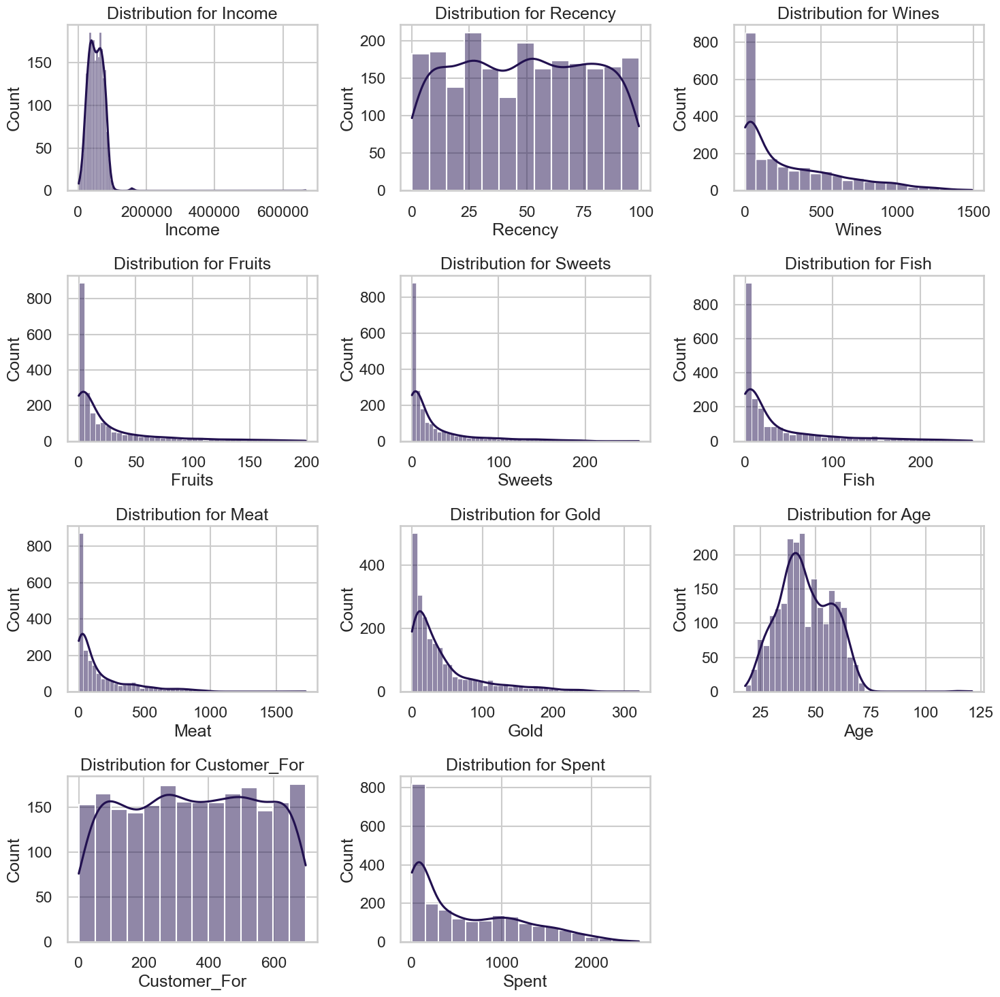

In [44]:
# plotting distributions for each feature in dataset
distributions = ['Income', 'Recency','Wines','Fruits',
                 'Sweets','Fish','Meat','Gold','Age',
                 'Customer_For','Spent']
num_rows, num_cols = 4, 3

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))

# Flatten the axes for easier iteration
axes = axes.flatten()

# Loop through numeric columns and create boxplots
for i, column in enumerate(distributions):
    sns.histplot(data=data, x=column, kde=True, ax=axes[i])
    axes[i].set_title(f'Distribution for {column}')

# Remove any remaining empty subplots
for j in range(len(distributions), len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.show()

In [45]:
# possible outliers in Income , Age, Fruits, Meat

## Outliers

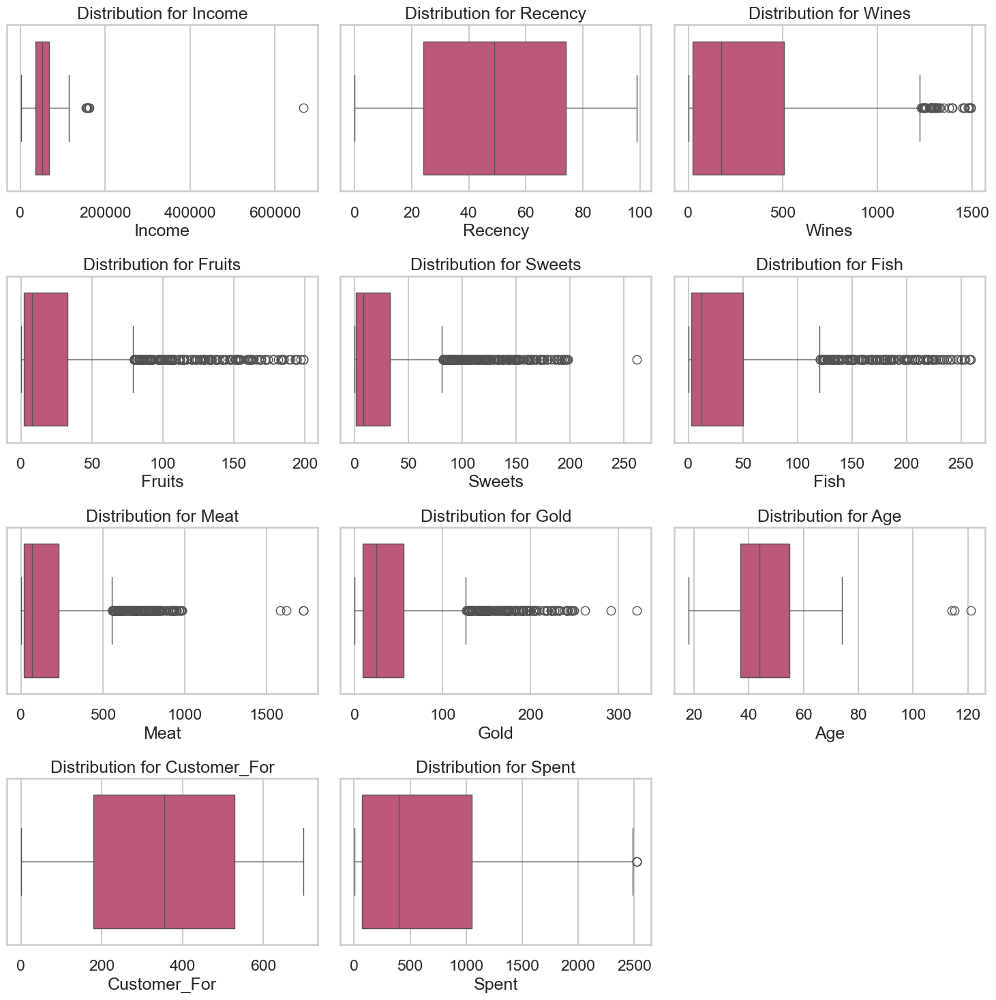

In [46]:
# outlier analysis using Boxplots
# plotting boxplots for each feature in dataset
distributions = ['Income', 'Recency','Wines','Fruits',
                 'Sweets','Fish','Meat','Gold','Age',
                 'Customer_For','Spent']
num_rows, num_cols = 4, 3

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))

# Flatten the axes for easier iteration
axes = axes.flatten()

# Loop through numeric columns and create boxplots
for i, column in enumerate(distributions):
    sns.boxplot(data=data, x=column,  ax=axes[i], palette='plasma')
    axes[i].set_title(f'Distribution for {column}')

# Remove any remaining empty subplots
for j in range(len(distributions), len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.show()

In [47]:
# removing outliers:
data = data[(data["Age"]<90)]
data = data[(data["Income"]<600000)]
data = data[(data["Sweets"]<200)]
data = data[(data["Meat"]<1000)]
data = data[(data["Income"]<140000)]
data.shape

(2203, 30)

## Relationships in Dataset

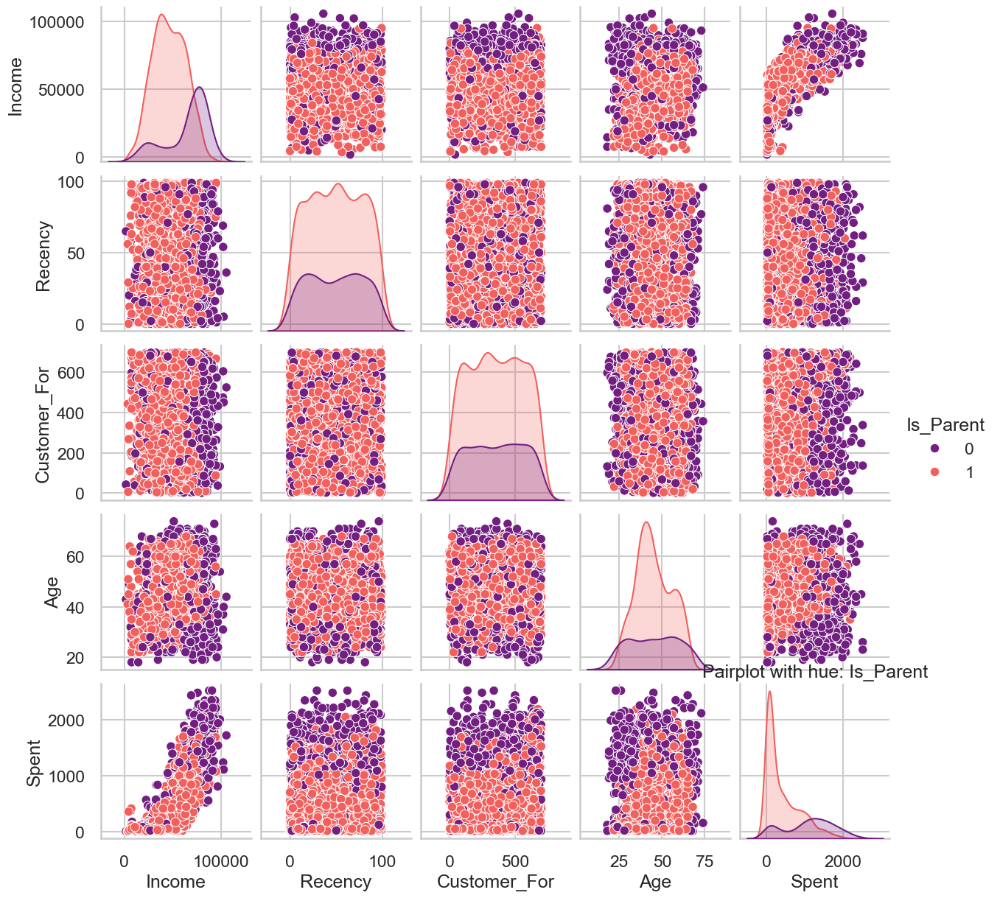

In [48]:
# Pairplot for selected features: hue = Is_Parent
# features: Income , Recency , Customer_For, Age, Spent
sns.pairplot(data[['Income','Recency','Customer_For','Age','Spent','Is_Parent']] , hue='Is_Parent',palette='magma')
plt.title('Pairplot with hue: Is_Parent')
plt.show()

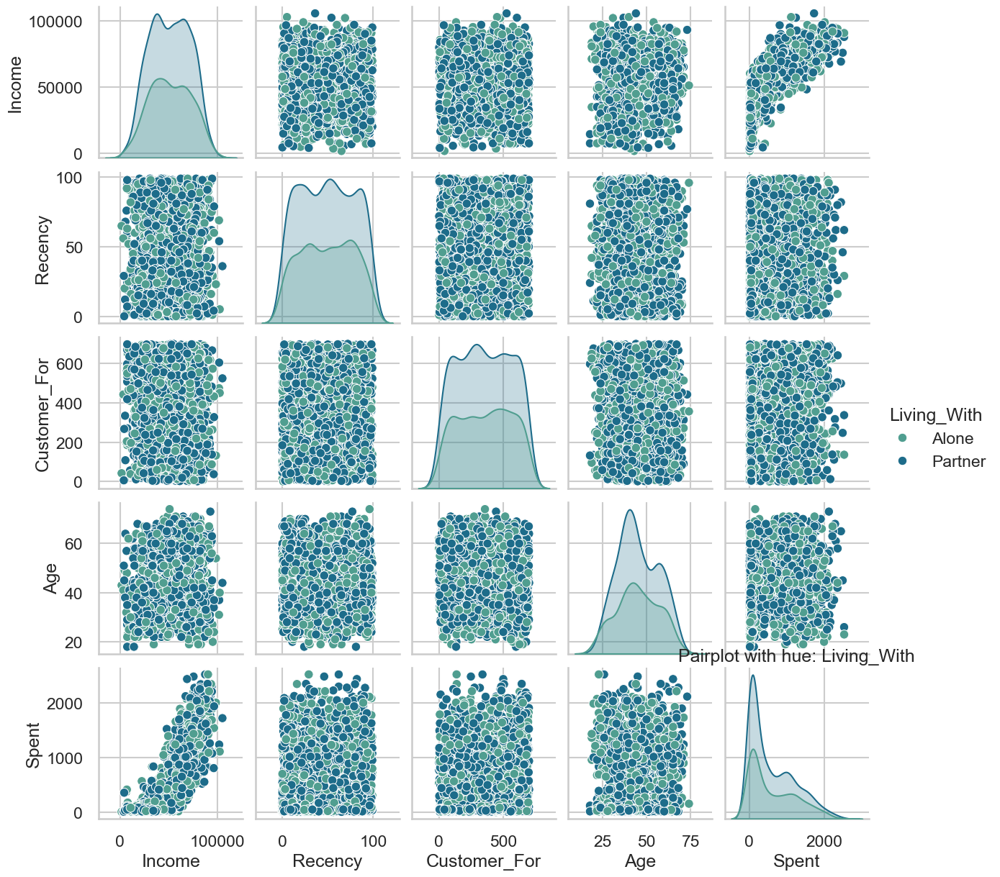

In [49]:
# Pairplot for selected features: hue = Living_With
# features: Income , Recency , Customer_For, Age, Spent
sns.pairplot(data[['Income','Recency','Customer_For','Age','Spent','Living_With']] ,
             hue='Living_With',palette='crest')
plt.title('Pairplot with hue: Living_With')
plt.show()

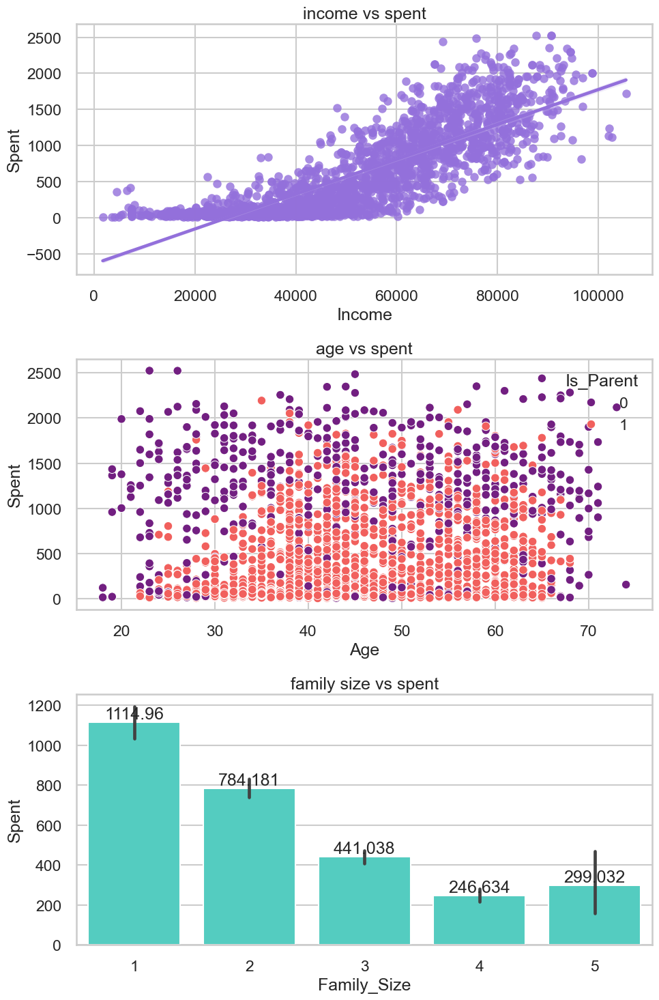

In [50]:
# Spent vs Income , Age, Family_Size, 
# Create subplots
sns.set_palette('magma')
fig, axes = plt.subplots(3, 1, figsize=(10,15))
sns.regplot(data=data, x='Income',y='Spent',  ax=axes[0],color='MediumPurple')
sns.scatterplot(data=data, x='Age',y='Spent',hue='Is_Parent' ,ax=axes[1], palette='magma')

sns.barplot(data=data, x='Family_Size',y='Spent',  ax=axes[2],color='Turquoise')
axes[0].set_title('income vs spent')
axes[1].set_title('age vs spent')

axes[2].set_title('family size vs spent')
for container in axes[2].containers:
    axes[2].bar_label(container)


plt.tight_layout()
plt.show()

In [51]:
# reset the index 
data.reset_index(drop=True, inplace=True)
data

,Education,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Customer_For,Age,Spent,Living_With,Children,Family_Size,Is_Parent
0,Graduate,58138.0,0,0,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,663,57,1617,Alone,0,1,0
1,Graduate,46344.0,1,1,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0,113,60,27,Alone,2,3,1
2,Graduate,71613.0,0,0,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0,312,49,776,Partner,0,2,0
3,Graduate,26646.0,1,0,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0,139,30,53,Partner,1,3,1
4,Postgraduate,58293.0,1,0,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0,161,33,422,Partner,1,3,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2198,Graduate,61223.0,0,1,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,0,381,47,1341,Partner,1,3,1
2199,Postgraduate,64014.0,2,1,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,0,19,68,444,Partner,3,5,1
2200,Graduate,56981.0,0,0,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,0,155,33,1241,Alone,0,1,0
2201,Postgraduate,69245.0,0,1,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,0,156,58,843,Partner,1,3,1


In [52]:
campaign = data[['AcceptedCmp1','AcceptedCmp2',
                 'AcceptedCmp3','AcceptedCmp4',
                 'AcceptedCmp5',
                 'Response']].sum().reset_index().rename(columns={'index':'campaign_no.',0:'count'})

In [53]:
campaign

,campaign_no.,count
0,AcceptedCmp1,142
1,AcceptedCmp2,30
2,AcceptedCmp3,163
3,AcceptedCmp4,164
4,AcceptedCmp5,161
5,Response,333


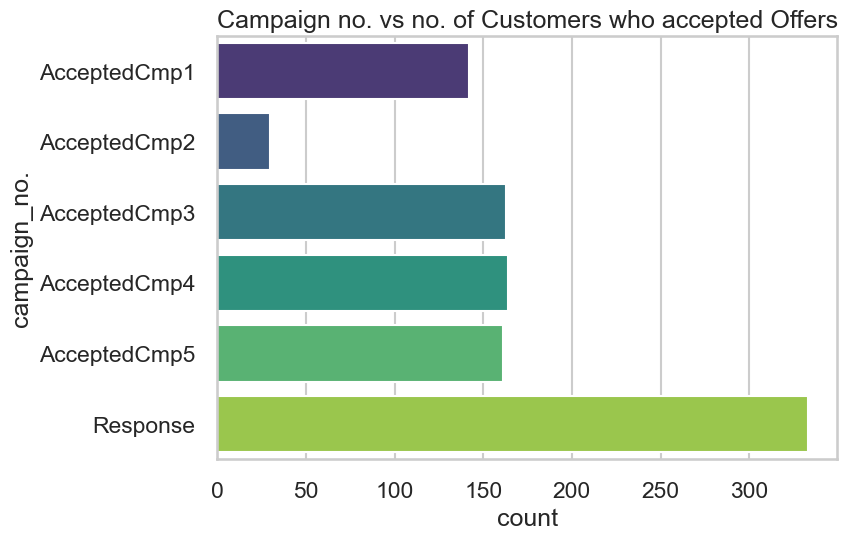

In [54]:
# which was most successful campaign:
sns.barplot(data=campaign, y='campaign_no.',x='count', palette='viridis')
plt.title('Campaign no. vs no. of Customers who accepted Offers')
plt.show()

In [55]:
# campaign 2 was least successful and under-performed

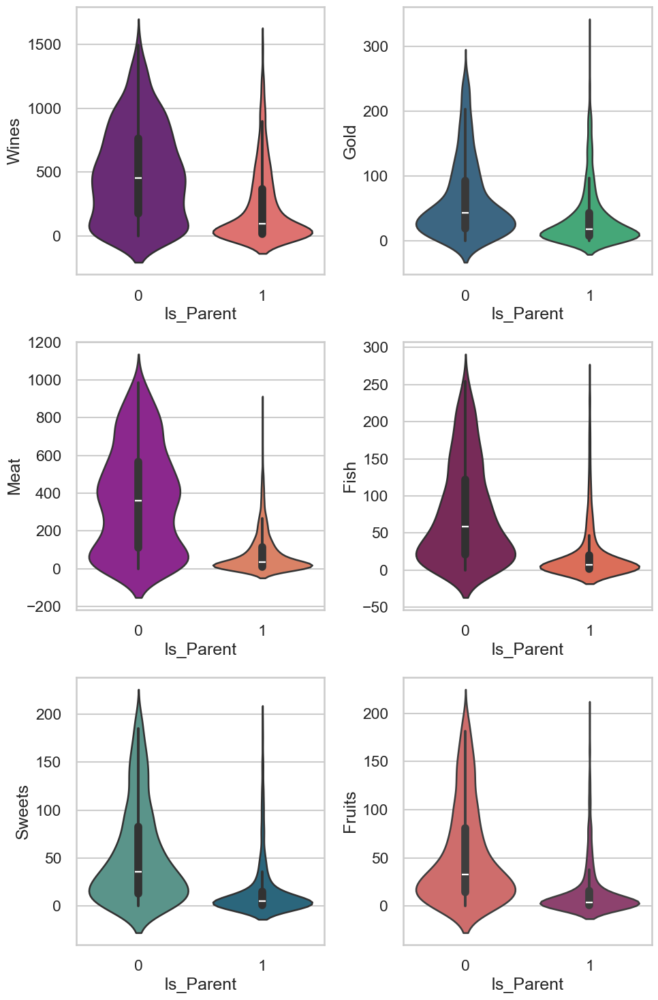

In [56]:
# violin plots for Wines, Fruits, Gold, Meat,  Fish, Sweets
fig, axes = plt.subplots(3, 2, figsize=(10,15))
sns.set_context('talk')
sns.violinplot(data=data, y='Wines', x='Is_Parent', ax=axes[0,0], palette='magma')
sns.violinplot(data=data, y='Gold', x='Is_Parent', ax=axes[0,1], palette='viridis')
sns.violinplot(data=data, y='Meat', x='Is_Parent', ax=axes[1,0], palette='plasma')
sns.violinplot(data=data, y='Fish', x='Is_Parent', ax=axes[1,1], palette='rocket')
sns.violinplot(data=data, y='Sweets', x='Is_Parent', ax=axes[2,0], palette='crest')
sns.violinplot(data=data, y='Fruits', x='Is_Parent', ax=axes[2,1], palette='flare')

plt.tight_layout()
plt.show()

## Heatmaps for Correlation Analysis

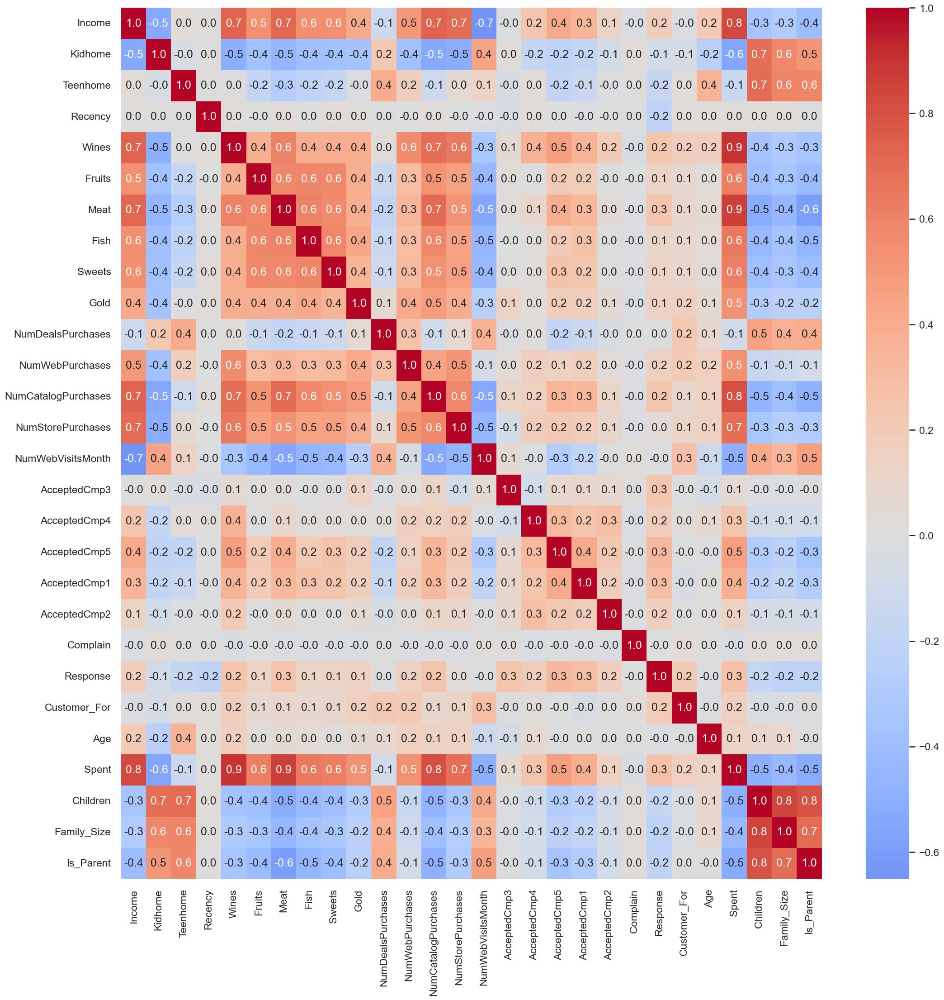

In [57]:
# Correlation matrix Heatmap , 
# analysing relationships between features in dataset
plt.figure(figsize=(25,25))
corr_matrix= data.drop(['Education','Living_With'],axis=1).corr()
sns.heatmap(corr_matrix,annot=True, cmap='coolwarm', center=0,cbar=True,fmt='.1f')
plt.show()

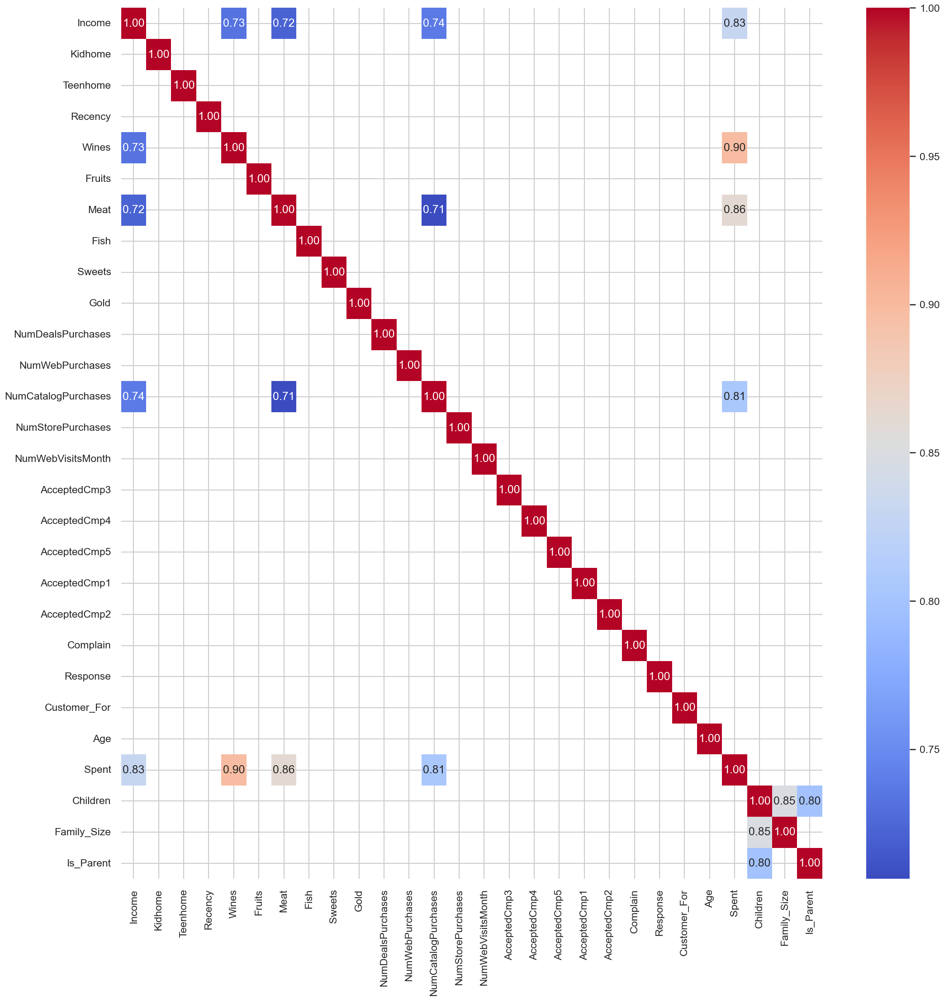

In [58]:
# finding highly correlated features (abs_corr> 0.7)

filtered_corr = corr_matrix[corr_matrix.abs() > 0.7]

plt.figure(figsize=(25,25))

# Create heatmap
sns.heatmap(filtered_corr, annot=True, fmt='.2f', cmap='coolwarm')
plt.show()

# Data Preprocessing

## Label Encoding

In [59]:
# label encoding to convert categorical to numerical discrete values
categorical_cols = [column for column in data.columns if data[column].dtype=='object']

label_encoder = LabelEncoder() 
for column in categorical_cols:
    data[column]=data[[column]].apply(label_encoder.fit_transform)

In [60]:
data.head()

,Education,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Customer_For,Age,Spent,Living_With,Children,Family_Size,Is_Parent
0,0,58138.0,0,0,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,663,57,1617,0,0,1,0
1,0,46344.0,1,1,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0,113,60,27,0,2,3,1
2,0,71613.0,0,0,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0,312,49,776,1,0,2,0
3,0,26646.0,1,0,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0,139,30,53,1,1,3,1
4,1,58293.0,1,0,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0,161,33,422,1,1,3,1


## Standardization

In [61]:
#copy of data
data_copy = data.copy()

# dropping columns from data_copy which should not be normalized
cols_del = ['AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 
            'AcceptedCmp1','AcceptedCmp2', 'Complain', 'Response']
data_copy.drop(columns=cols_del, axis=1,inplace=True)

#scaling data around mean=0 and std_dev=1
scaler = StandardScaler()
scaler.fit(data_copy)
scaled_data = pd.DataFrame(scaler.transform(data_copy),columns= data_copy.columns )

In [62]:
scaled_data

,Education,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Customer_For,Age,Spent,Living_With,Children,Family_Size,Is_Parent
0,-0.892306,0.315841,-0.823262,-0.931556,0.310090,0.973665,1.547619,1.771485,2.447935,1.493161,0.848688,0.367728,1.451225,2.682001,-0.564854,0.688269,1.527349,1.018399,1.680604,-1.348012,-1.267021,-1.760125,-1.585420
1,-0.892306,-0.255327,1.038798,0.905702,-0.381336,-0.875513,-0.639057,-0.737159,-0.652791,-0.637603,-0.736392,-0.168055,-1.148303,-0.595413,-1.182561,-0.141420,-1.189302,1.274910,-0.963690,-1.348012,1.402752,0.448050,0.630748
2,-0.892306,0.968419,-0.823262,-0.931556,-0.796191,0.354309,0.567385,-0.175037,1.335321,-0.147772,-0.040503,-0.703839,1.451225,-0.231255,1.288270,-0.556265,-0.206368,0.334369,0.281956,0.741833,-1.267021,-0.656037,-1.585420
3,-0.892306,-1.209276,1.038798,-0.931556,-0.796191,-0.875513,-0.563654,-0.672120,-0.506874,-0.588620,-0.755722,-0.168055,-0.776942,-0.959570,-0.564854,0.273425,-1.060878,-1.290202,-0.920450,0.741833,0.067865,0.448050,0.630748
4,0.571395,0.323348,1.038798,-0.931556,1.554657,-0.395438,0.416580,-0.216848,0.149750,-0.000823,-0.562420,1.439294,0.337141,0.132902,0.052854,-0.141420,-0.952212,-1.033691,-0.306774,0.741833,0.067865,0.448050,0.630748
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2198,-0.892306,0.465244,-0.823262,0.905702,-0.104765,1.192959,0.416580,0.080473,0.076792,2.227907,3.922196,-0.168055,1.822586,0.132902,-0.564854,-0.141420,0.134448,0.163361,1.221595,0.741833,0.067865,0.448050,0.630748
2199,0.571395,0.600409,2.900857,0.905702,0.240948,0.295041,-0.664191,-0.625664,-0.689270,-0.662094,-0.697731,2.510860,1.451225,-0.231255,-0.256000,0.688269,-1.653602,1.958940,-0.270186,0.741833,2.737638,2.656225,0.630748
2200,-0.892306,0.259809,-0.823262,-0.931556,1.450943,1.782681,0.542251,0.243070,-0.105604,-0.368196,-0.388447,-0.703839,-0.776942,0.132902,2.214832,0.273425,-0.981849,-1.033691,1.055287,-1.348012,-1.267021,-1.760125,-1.585420
2201,0.571395,0.853740,-0.823262,0.905702,-1.418475,0.360236,0.089835,0.229133,0.769895,0.072652,0.326771,-0.168055,0.708502,0.861216,1.288270,-0.971109,-0.976909,1.103902,0.393382,0.741833,0.067865,0.448050,0.630748


# Dimensionality Reduction

In [63]:
# dataset on which we do dimensionality reduction
scaled_data.head()

,Education,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Customer_For,Age,Spent,Living_With,Children,Family_Size,Is_Parent
0,-0.892306,0.315841,-0.823262,-0.931556,0.310090,0.973665,1.547619,1.771485,2.447935,1.493161,0.848688,0.367728,1.451225,2.682001,-0.564854,0.688269,1.527349,1.018399,1.680604,-1.348012,-1.267021,-1.760125,-1.585420
1,-0.892306,-0.255327,1.038798,0.905702,-0.381336,-0.875513,-0.639057,-0.737159,-0.652791,-0.637603,-0.736392,-0.168055,-1.148303,-0.595413,-1.182561,-0.141420,-1.189302,1.274910,-0.963690,-1.348012,1.402752,0.448050,0.630748
2,-0.892306,0.968419,-0.823262,-0.931556,-0.796191,0.354309,0.567385,-0.175037,1.335321,-0.147772,-0.040503,-0.703839,1.451225,-0.231255,1.288270,-0.556265,-0.206368,0.334369,0.281956,0.741833,-1.267021,-0.656037,-1.585420
3,-0.892306,-1.209276,1.038798,-0.931556,-0.796191,-0.875513,-0.563654,-0.672120,-0.506874,-0.588620,-0.755722,-0.168055,-0.776942,-0.959570,-0.564854,0.273425,-1.060878,-1.290202,-0.920450,0.741833,0.067865,0.448050,0.630748
4,0.571395,0.323348,1.038798,-0.931556,1.554657,-0.395438,0.416580,-0.216848,0.149750,-0.000823,-0.562420,1.439294,0.337141,0.132902,0.052854,-0.141420,-0.952212,-1.033691,-0.306774,0.741833,0.067865,0.448050,0.630748


In [64]:
# as there are many features, which are correlated , hence they are redundant 
# we will reduce the dimensions by using PCA Principal Component Analysis
# reducing scaled_data into 3 dimensions (for easy visualisation) 

## PCA

In [65]:
# reducing scaled_data to 3 dimensions (3 principal components) 
# 3 dimension easy to understand/interpret/ visualise

pca = PCA(n_components=3)
pca.fit(scaled_data)

pca_data = pd.DataFrame(pca.transform(scaled_data), columns=(["pc1","pc2", "pc3"]))

pca_data.head()

,pc1,pc2,pc3
0,5.065897,-0.161995,2.460440
1,-2.881022,0.026043,-1.545135
2,2.625571,-0.721947,-0.264510
3,-2.696855,-1.463614,-0.421425
4,-0.642574,0.214256,-0.122214


In [66]:
pca_data.shape

(2203, 3)

In [67]:
pca_data.describe().T # transposing describe result

,count,mean,std,min,25%,50%,75%,max
pc1,2203.0,1.612671e-16,2.913560,-6.075982,-2.574996,-0.791712,2.435036,7.542996
pc2,2203.0,-1.290137e-17,1.721255,-4.196265,-1.339258,-0.178214,1.234784,6.220966
pc3,2203.0,-1.693304e-17,1.234040,-3.692058,-0.859005,-0.053719,0.859214,6.904048


In [68]:
# Observation: pc1 has highest std , pc3 has lowest

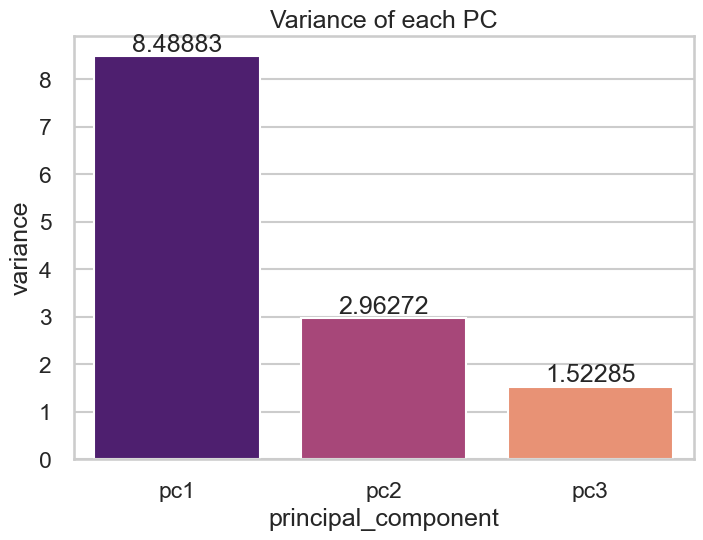

In [69]:
# Analysing Variance of Each Principle component:
pca_var = pca_data.var().reset_index().rename(columns={'index':'principal_component',
                                             0:'variance'})

sns.barplot(pca_var, x='principal_component',y='variance', palette='magma')

for container in plt.gca().containers:
    plt.bar_label(container)

plt.title('Variance of each PC')
plt.show()


## PCA Visualisation

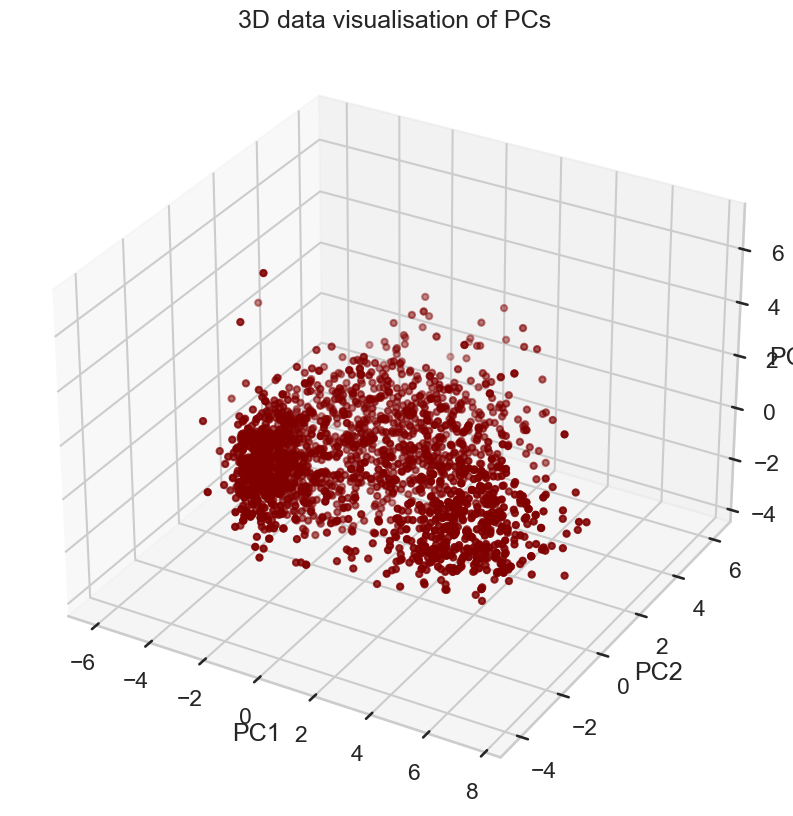

In [70]:
# 3d projection of Data in reduced dimensions

x =pca_data["pc1"]
y =pca_data["pc2"]
z =pca_data["pc3"]

fig = plt.figure(figsize=(20,10))

ax = fig.add_subplot(111, projection="3d")
ax.scatter(x,y,z, c="maroon", marker="o" )
ax.set_title("3D data visualisation of PCs")

ax.set_xlabel('PC1')  
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
plt.show()

# Clustering (Model Research)

##  K-means clustering (Partitional Clustering)

In [71]:
# steps:
# 1. Elbow Method to determine no. of clusters
# 2. Clustering
# 3. Cluster Visualization 

### Elbow Method

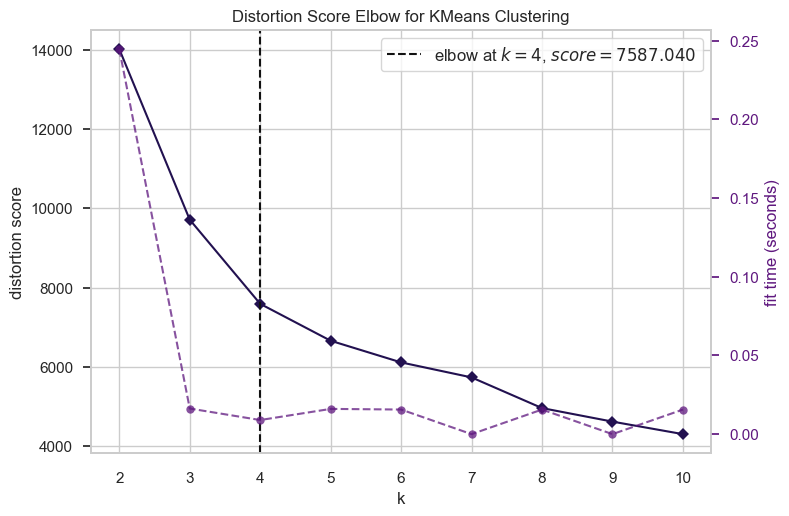

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [72]:
sns.set_context('notebook')
elbow = KElbowVisualizer(KMeans(), k=10)
elbow.fit(pca_data)
elbow.show()

In [73]:
# k=4 for k means clustering using Elbow Method

### When to Use Agglomerative Clustering
Agglomerative clustering is a hierarchical technique that treats each data point as its own cluster and gradually merges them based on proximity.

1. **Small Datasets**:  
   - Works well with smaller datasets because it has higher computational complexity (usually \(O(n^2 \log n)\)).

2. **No Predefined Number of Clusters**:  
   - Ideal when the number of clusters is unknown. The dendrogram can help identify natural clusters.

3. **Hierarchical Structure**:  
   - Useful for understanding relationships between clusters, as the result can be visualized as a dendrogram.

4. **Non-Spherical Clusters**:  
   - Captures non-spherical clusters better compared to KMeans.

5. **Clusters of Unequal Sizes**:  
   - More flexible with clusters of irregular shape or unequal size.

**Example Use Cases**:  
   - Customer segmentation, gene expression data, or datasets where the number of clusters is unclear and hierarchical relationships are valuable.



### When to Use K-Means Clustering
KMeans is a centroid-based method that partitions data into a predefined number of clusters (k), optimizing the distance between points and cluster centroids.

1. **Large Datasets**:  
   - Efficient for larger datasets due to its linear time complexity \(O(n)\), making it highly scalable.

2. **Spherical or Convex Clusters**:  
   - Works best with clusters that are roughly spherical in shape and similar in size. It struggles with non-convex or irregularly shaped clusters.

3. **Predefined Number of Clusters**:  
   - Suitable when the number of clusters is known or can be estimated using the elbow method.

4. **Fast Convergence**:  
   - Faster and more scalable, making it ideal for applications where speed is essential.

**Example Use Cases**:  
   - Grouping customers based on purchasing behavior or any data that naturally forms spherical clusters.


In [74]:
# try k means clustering with k=4
kmeans_data = pca_data.copy()

kmeans = KMeans(n_clusters=4, random_state=0)
kmeans.fit(kmeans_data)

labels = kmeans.labels_

kmeans_data['labels'] = labels

# View the segmented customer data with their clusters
kmeans_data

,pc1,pc2,pc3,labels
0,5.065897,-0.161995,2.460440,3
1,-2.881022,0.026043,-1.545135,0
2,2.625571,-0.721947,-0.264510,3
3,-2.696855,-1.463614,-0.421425,2
4,-0.642574,0.214256,-0.122214,0
...,...,...,...,...
2198,2.355522,2.428793,0.447941,1
2199,-3.061503,4.088277,-1.397127,0
2200,2.666855,-1.911149,0.555738,3
2201,1.548868,1.650810,-1.782769,1


### Visualising K means clusters

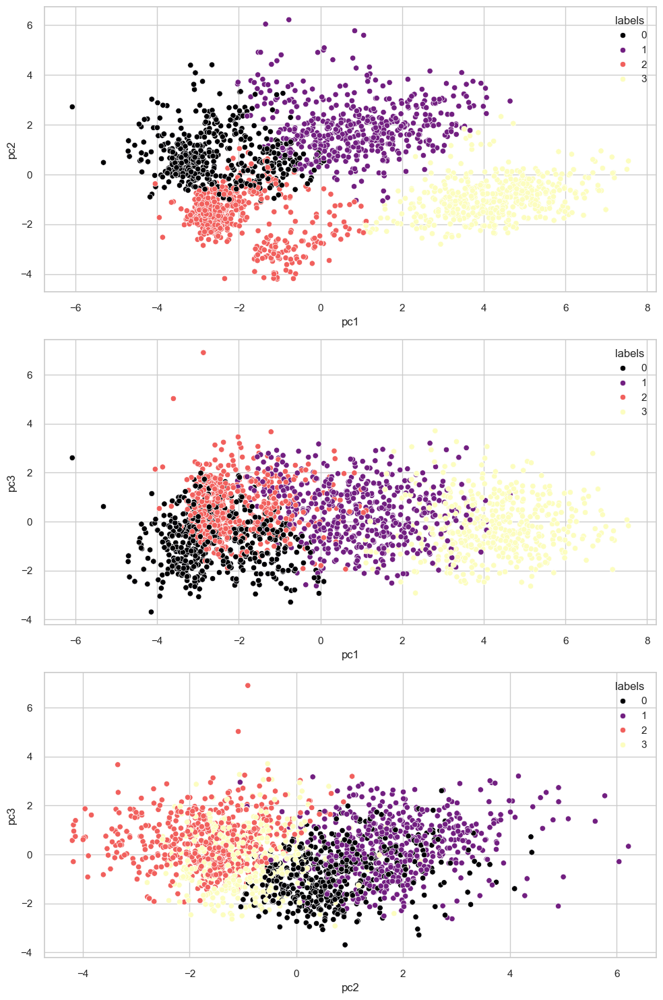

In [75]:
# visualising K-means clusters in 2D plots
fig, axes = plt.subplots(3, 1, figsize=(10,15))
sns.set_context('notebook')
sns.scatterplot(kmeans_data, x='pc1', y='pc2', palette='magma', hue='labels', ax=axes[0])
sns.scatterplot(kmeans_data, x='pc1', y='pc3', palette='magma', hue='labels',ax=axes[1])
sns.scatterplot(kmeans_data, x='pc2', y='pc3', palette='magma', hue='labels',ax=axes[2])

plt.tight_layout()
plt.show()

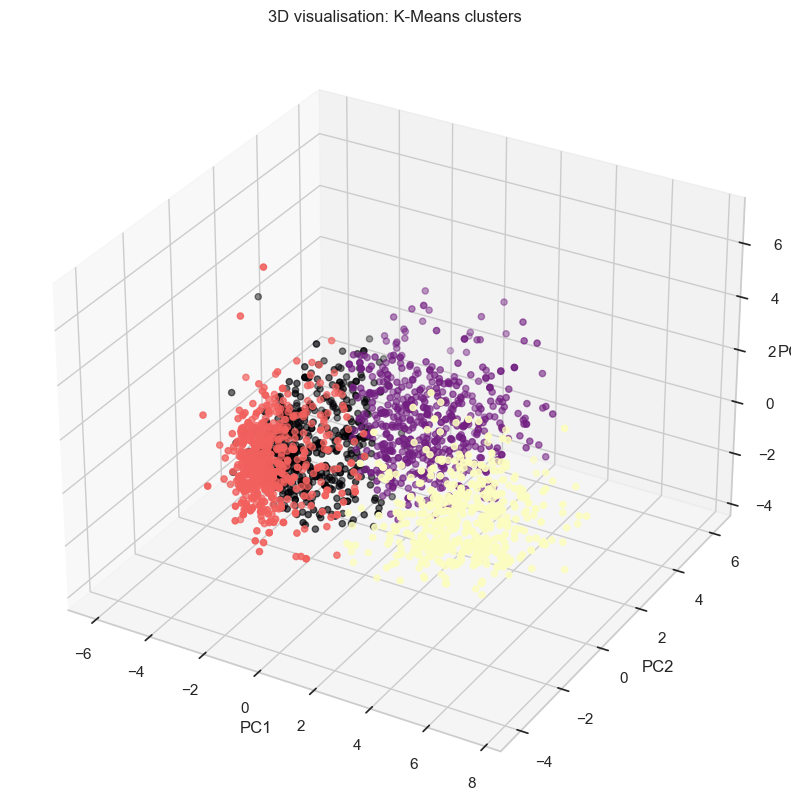

In [76]:
# visualising 3D plot for K means clusters
x =kmeans_data["pc1"]
y =kmeans_data["pc2"]
z =kmeans_data["pc3"]

fig = plt.figure(figsize=(20,10))

ax = fig.add_subplot(111, projection="3d")
ax.scatter(x,y,z,  marker="o", c=kmeans_data['labels'], cmap='magma' )
ax.set_title("3D visualisation: K-Means clusters")

ax.set_xlabel('PC1')  
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

plt.show()

## Agglomerative Clustering (Heirarchical Clustering)

In [2]:
# agglomerative clustering with k=4 
# parameter n_clusters given so algo defines the problem statement
# in finding 4 clusters in data

In [78]:
# agglomerative clustering for k=4
ac = AgglomerativeClustering(n_clusters=4)
labels = ac.fit_predict(pca_data)

agglo_data = pca_data.copy()
agglo_data['labels'] = labels
agglo_data.head()

,pc1,pc2,pc3,labels
0,5.065897,-0.161995,2.460440,1
1,-2.881022,0.026043,-1.545135,0
2,2.625571,-0.721947,-0.264510,1
3,-2.696855,-1.463614,-0.421425,3
4,-0.642574,0.214256,-0.122214,0


### visualising agglomerative clusters

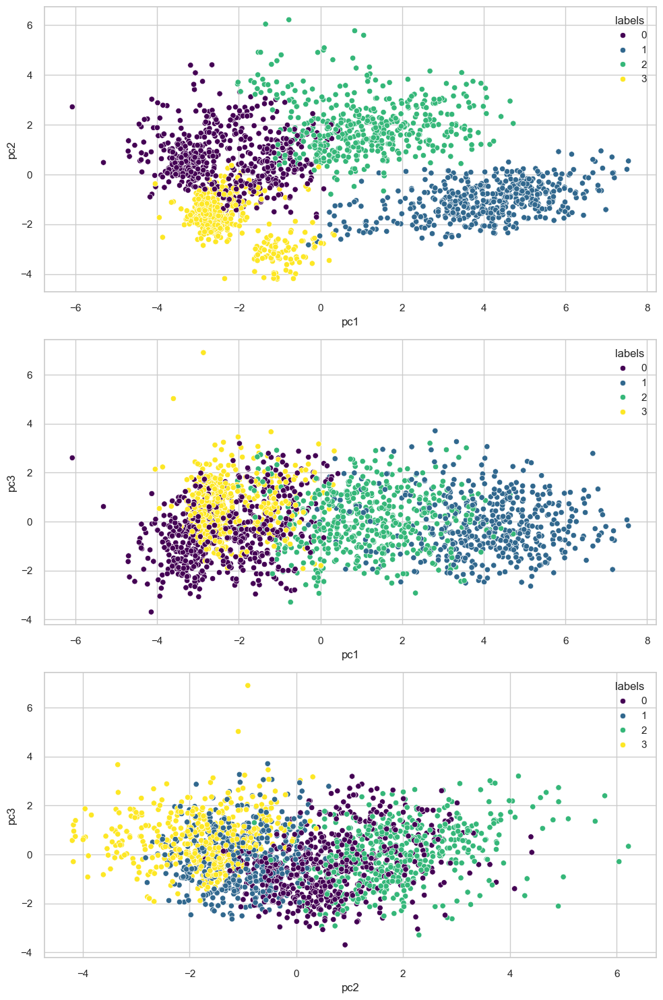

In [79]:
# visualising Agglomorative clusters in 2D plots
fig, axes = plt.subplots(3, 1, figsize=(10,15))
sns.set_context('notebook')
sns.scatterplot(agglo_data, x='pc1', y='pc2', palette='viridis', hue='labels', ax=axes[0])
sns.scatterplot(agglo_data, x='pc1', y='pc3', palette='viridis', hue='labels',ax=axes[1])
sns.scatterplot(agglo_data, x='pc2', y='pc3', palette='viridis', hue='labels',ax=axes[2])

plt.tight_layout()
plt.show()

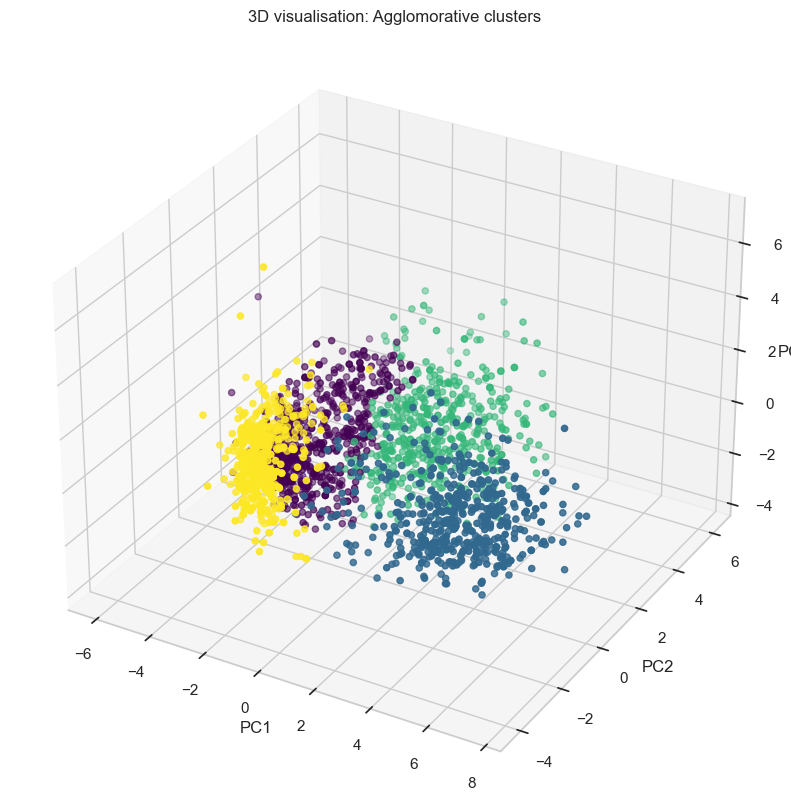

In [80]:
# visualising 3D plot for Agglomorative Clustering
x =agglo_data["pc1"]
y =agglo_data["pc2"]
z =agglo_data["pc3"]

fig = plt.figure(figsize=(20,10))

ax = fig.add_subplot(111, projection="3d")
ax.scatter(x,y,z,  marker="o", c=agglo_data['labels'], cmap='viridis' )
ax.set_title("3D visualisation: Agglomorative clusters")

ax.set_xlabel('PC1')  
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

plt.show()

In [81]:
# why agglomorative Clustering gave such result?
# Where is heirarchy?

### Dendrogram

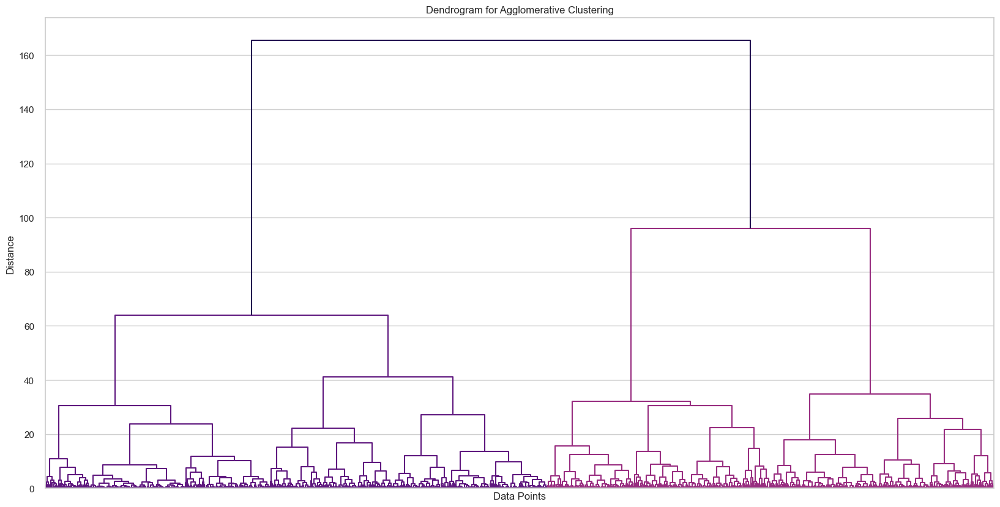

In [82]:
# plotting dendrogram to visualise the relationship in clustering process
# Create a linkage matrix for the dendrogram after Clustering

linkage_matrix = sch.linkage(pca_data, method='ward') #ward keeps min variance within cluster

# plotting the dendrogram
plt.figure(figsize=(20, 10))
dendrogram = sch.dendrogram(linkage_matrix)

plt.title('Dendrogram for Agglomerative Clustering')
plt.xlabel('Data Points')
plt.xticks([])
plt.ylabel('Distance')
plt.show()

### Heatmap data : Before vs After

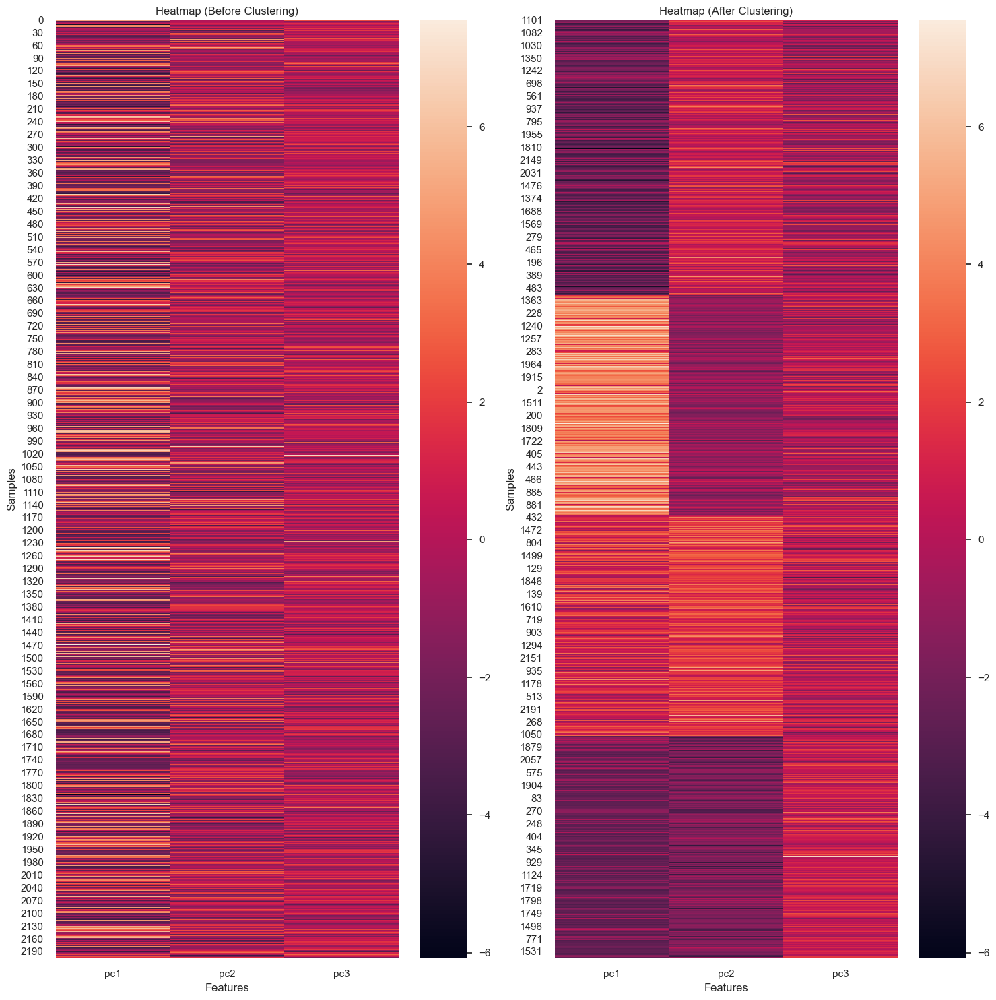

In [83]:
# before and after comparision of pca_data 
# using heatmap representation
fig, axes = plt.subplots(1, 2, figsize=(15,15))
sns.set_context('notebook')

# heatmap representation of pca_data before clustering
sns.heatmap(pca_data, ax=axes[0])
axes[0].set_title('Heatmap (Before Clustering)')
axes[0].set_xlabel('Features')
axes[0].set_ylabel('Samples')

# after cluster heatmap of pca_data (sorting datapoints with labels) 
after_cluster_data = agglo_data.sort_values(by='labels').drop('labels',axis=1)

sns.heatmap(after_cluster_data, ax=axes[1])
axes[1].set_title('Heatmap (After Clustering)')
axes[1].set_xlabel('Features')
axes[1].set_ylabel('Samples')

plt.tight_layout()
plt.show()

## DB-Scan Clustering

In [84]:
# density based clustering: No 'K' required 
# DBSCAn does not need no. of clusters to do clusters

- **Cluster Formation**:  
  Forms clusters based on density, allowing detection of clusters with arbitrary shapes.

- **Parameters**:  
  Does not require a predefined number of clusters. Instead, it uses:
  - `eps`: Maximum distance between points to be considered neighbors.
  - `min_samples`: Minimum number of points required in a neighborhood to form a cluster.

- **Outliers**:  
  Identifies and labels noise points that do not belong to any cluster.

- **Use Case**:  
  Suitable for datasets with varying densities and noise.

**Example Use Cases**:  
  Geospatial data clustering, image segmentation, and any data with irregularly shaped clusters and noise.


In [85]:
# eps=epsilon : max distance b/w 2 samples to be in neighborhood
# min_samples : min samples in neighborhood to form dense region,
# min_samples help determine the core points

dbscan = DBSCAN(eps=0.5, min_samples=5)
clusters = dbscan.fit_predict(pca_data)

dbscan_data = pca_data.copy()
dbscan_data['labels'] = clusters
dbscan_data.head()

,pc1,pc2,pc3,labels
0,5.065897,-0.161995,2.460440,-1
1,-2.881022,0.026043,-1.545135,0
2,2.625571,-0.721947,-0.264510,1
3,-2.696855,-1.463614,-0.421425,0
4,-0.642574,0.214256,-0.122214,0


### DBSCAN detects outliers

In [86]:
dbscan_data.labels.unique() # clusters formed using dbscan :21 clusters

array([-1,  0,  1,  2, 14,  3,  4, 11,  5,  6,  7, 19, 10, 13, 16,  9,  8,
       12, 15, 18, 17, 20], dtype=int64)

In [87]:
# label = -1 means that datapoint is an outlier / noise 
# not part of any cluster

In [88]:
dbscan_data.labels.value_counts()

labels
 0     1227
-1      439
 1      342
 2       54
 9       21
 7       14
 4       11
 12       9
 14       9
 16       9
 3        8
 6        8
 11       7
 10       7
 15       7
 18       5
 19       5
 8        5
 5        5
 13       4
 17       4
 20       3
Name: count, dtype: int64

In [89]:
# 439 data points are noise acc to DBSCAN (Outliers)
# removing noise:
#dbscan_data = dbscan_data[dbscan_data.labels!=-1] 

### Visualising dbscan clusters

In [90]:
# creating a custom colormap to use (21 labels)
colors = [
    "#F1FAEE",  # Light Gray
    "#E63946",  # Crimson Red
    
    "#F1C40F",  # Bright Yellow
    "#A8DADC",  # Light Cyan
    "#457B9D",  # Steel Blue
    "#F15BB5",  # Bright Pink
    "#FF6F61",  # Coral
    "#6A0572",  # Dark Purple
    "#FF9F00",  # Amber
    "#00B300",  # Green
    "#FF3D00",  # Bright Orange
    "#007A8A",  # Teal
    "#8A2BE2",  # Blue Violet
    "#FFD700",  # Gold
    "#2E8B57",  # Sea Green
    "#FF1493",  # Deep Pink
    "#4B0082",  # Indigo
    "#FF4500",  # Orange Red
    "#FFB300",  # Bright Yellow
    "#00BFFF",  # Sky Blue
    "#8B4513",  # Saddle Brown
    "#080808",  # black
]

custom_cmap = ListedColormap(colors)

In [91]:
len(colors)

22

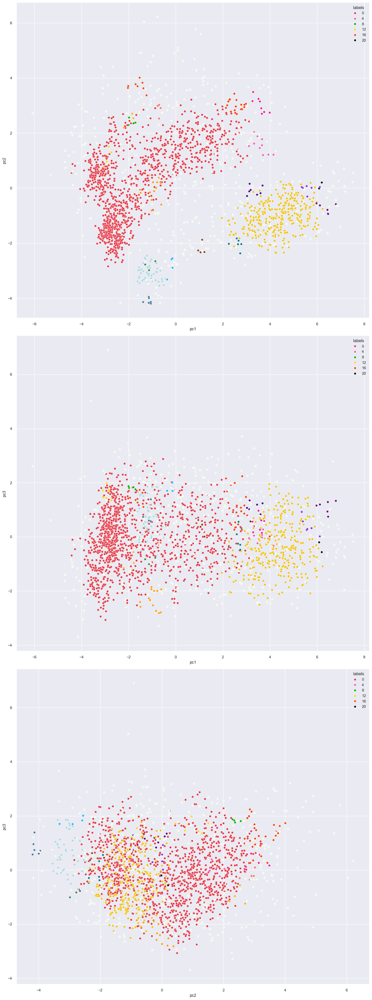

In [92]:
# visualising DBSCAN clusters in 2D plots
sns.set_style('darkgrid')
fig, axes = plt.subplots(3, 1, figsize=(15,40))
sns.set_context('notebook')
sns.scatterplot(dbscan_data, x='pc1', y='pc2', palette=custom_cmap, hue='labels', ax=axes[0])
sns.scatterplot(dbscan_data, x='pc1', y='pc3', palette=custom_cmap, hue='labels',ax=axes[1])
sns.scatterplot(dbscan_data, x='pc2', y='pc3',  palette=custom_cmap, hue='labels',ax=axes[2])

plt.tight_layout()
plt.show()

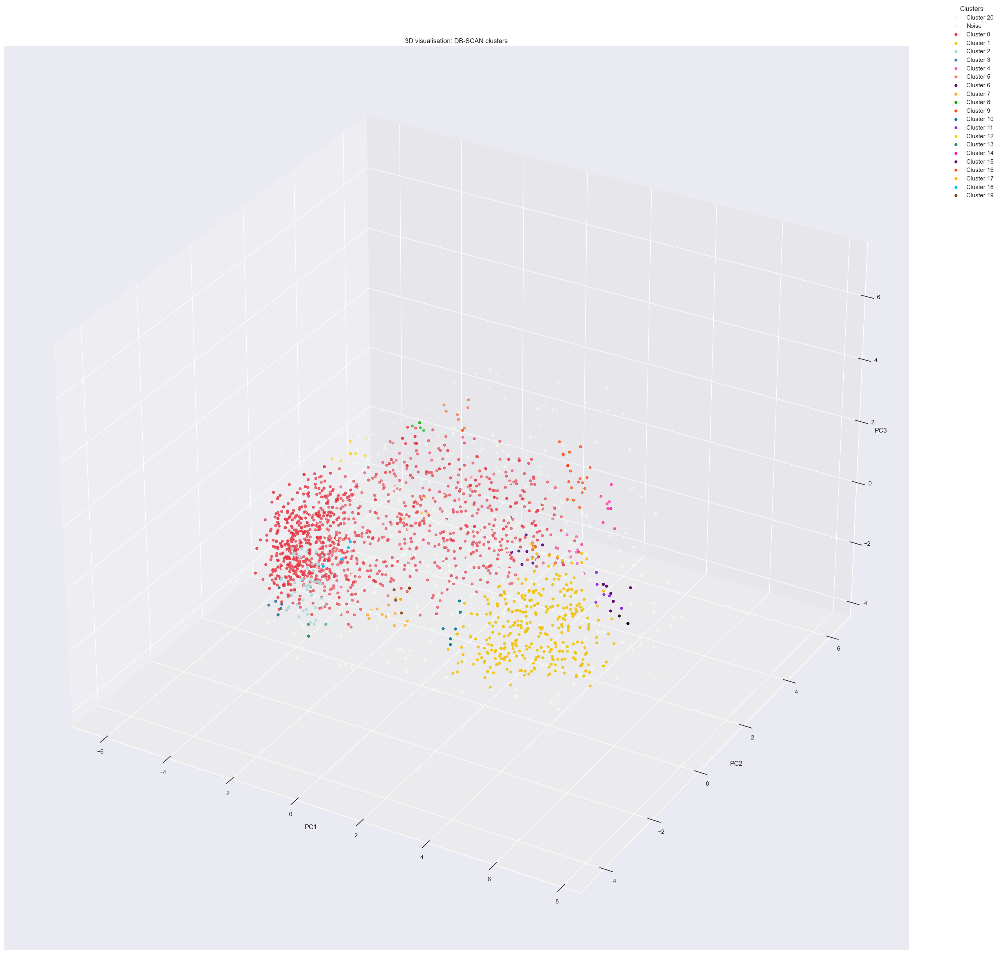

In [93]:
# visualising 3D plot for DBSCAN clusters
x =dbscan_data["pc1"]
y =dbscan_data["pc2"]
z =dbscan_data["pc3"]

fig = plt.figure(figsize=(30,30))

ax = fig.add_subplot(111, projection="3d")
ax.scatter(x,y,z,  marker="o", c=dbscan_data['labels'], cmap=custom_cmap)
ax.set_title("3D visualisation: DB-SCAN clusters")

ax.set_xlabel('PC1')  
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')


# Get unique labels
unique_labels = np.unique(dbscan_data['labels'])

# Create legend labels
legend_labels = [f'Cluster {label}' if label != -1 else 'Noise' for label in unique_labels]

# Create scatter plot for legend
for label in unique_labels:
    ax.scatter([], [], [], marker="o", c=custom_cmap(label), label=legend_labels[label])

# Add the legend to the plot
ax.legend(title='Clusters', loc='upper right', bbox_to_anchor=(1.1, 1.05))
plt.show()

# Model Evaluation 

In [94]:
# adding labels to the original dataset:
df_kmeans = data.copy()
df_kmeans['labels'] = kmeans_data['labels']

df_agglo = data.copy()
df_agglo['labels'] = agglo_data['labels']

df_dbscan = data.copy()
df_dbscan['labels'] = dbscan_data['labels']
#remove noise for dbscan:
df_dbscan= df_dbscan[df_dbscan['labels']!=-1]

## Clustering Evaluation Metrics

### Silhouette Score
- **Definition**: Measures how similar an object is to its own cluster compared to other clusters.
- **Range**: -1 to 1
- **Interpretation**: Higher values indicate better clustering, with values closer to 1 suggesting that clusters are well-separated.

### Davies-Bouldin Score
- **Definition**: Evaluates the average similarity ratio of each cluster with the cluster most similar to it.
- **Range**: Non-negative values (lower is better)
- **Interpretation**: A lower Davies-Bouldin score indicates better clustering, as it implies clusters are more distinct from each other.

In [95]:
# Silhouette Score
# Davies-Bouldin Score
sil_scores = [silhouette_score(df_kmeans, df_kmeans['labels']),
              silhouette_score(df_agglo, df_agglo['labels']),
              silhouette_score(df_dbscan, df_dbscan['labels']) ]
              
db_scores = [davies_bouldin_score(df_kmeans, df_kmeans['labels']),
             davies_bouldin_score(df_agglo, df_agglo['labels']),
             davies_bouldin_score(df_dbscan, df_dbscan['labels'])]
             
print('silouette_scores: ',sil_scores) # should be higher
print('davies_bouldin_scores: ',db_scores) # should be lower

x_labels= ['K_Means','Agglomerative','DBSCAN']

silouette_scores:  [0.11352887024052394, 0.12756862755658316, -0.6023599628413117]
davies_bouldin_scores:  [1.310778157588637, 1.5309384971518176, 9.86207881036852]


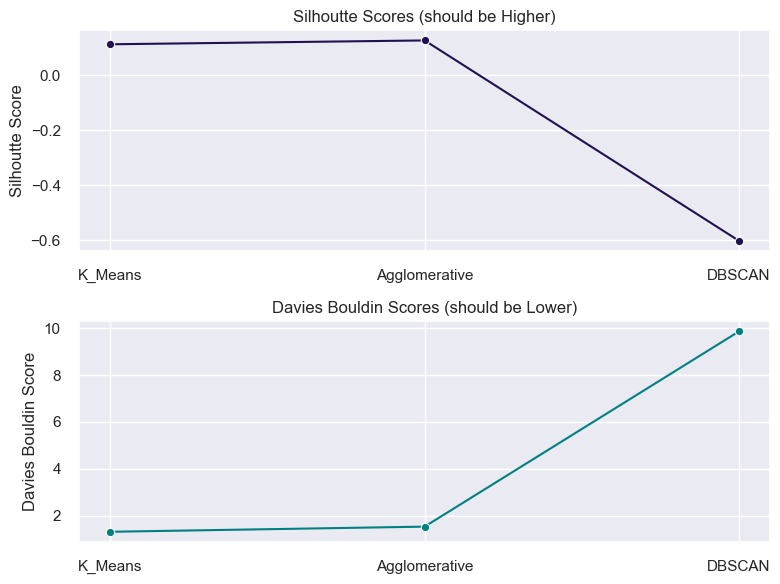

In [96]:
# plotting sil_scores and db_scores:
fig, axes = plt.subplots(2, 1, figsize=(8,6))
sns.set_context('notebook')

sns.lineplot(x=x_labels,y=sil_scores,marker='o',ax=axes[0])
axes[0].set_title('Silhoutte Scores (should be Higher)')
axes[0].set_ylabel('Silhoutte Score')
sns.lineplot(x=x_labels,y=db_scores,marker='o',ax=axes[1],c='teal')
axes[1].set_title('Davies Bouldin Scores (should be Lower)')
axes[1].set_ylabel('Davies Bouldin Score')

plt.tight_layout()
plt.show()

In [97]:
# DBSCAN HAS THE WORST PERFORMANCE OF ALL MODELS
# We Should Consider Kmeans or Agglo_Clustering for Customer Segmentation

# Understanding Clusters: Customer Segments

In [98]:
# this is important to solve our business problem,
# understanding how customers are segregated based on diff attributes

In [99]:
# we will clusters formed by agglomerative clustering for further analysis:
df_agglo.head(2)

,Education,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Customer_For,Age,Spent,Living_With,Children,Family_Size,Is_Parent,labels
0,0,58138.0,0,0,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,663,57,1617,0,0,1,0,1
1,0,46344.0,1,1,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0,113,60,27,0,2,3,1,0


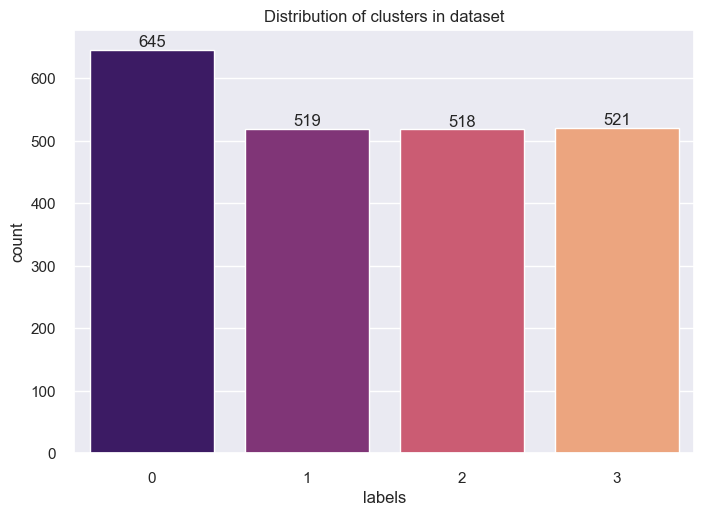

In [100]:
# count of each label in dataset
sns.countplot(data=df_agglo, x='labels', palette='magma')
plt.title('Distribution of clusters in dataset')
for container in plt.gca().containers:
    plt.bar_label(container)
plt.show()

In [101]:
# clusters are fairly distributed

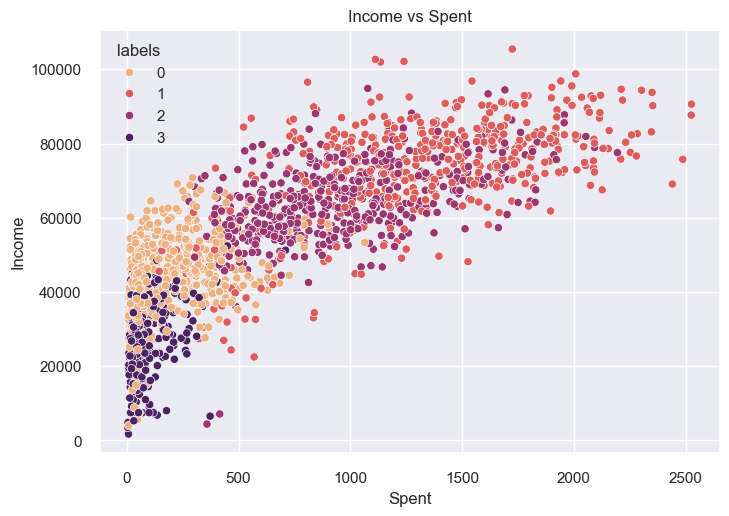

In [102]:
# identifying clusters in income vs spent plot
sns.scatterplot(df_agglo, x='Spent', y='Income', hue='labels', palette='flare')
plt.title('Income vs Spent')
plt.show()

## Observations on Customer Segments

- **Label 1**:  
  **Higher income, higher spending**

- **Label 3**:  
  **Lower income, lower spending**

- **Label 2**:  
  **Average income, high/average spending**

- **Label 0**:  
  **Average/lower income, average/lower spending**


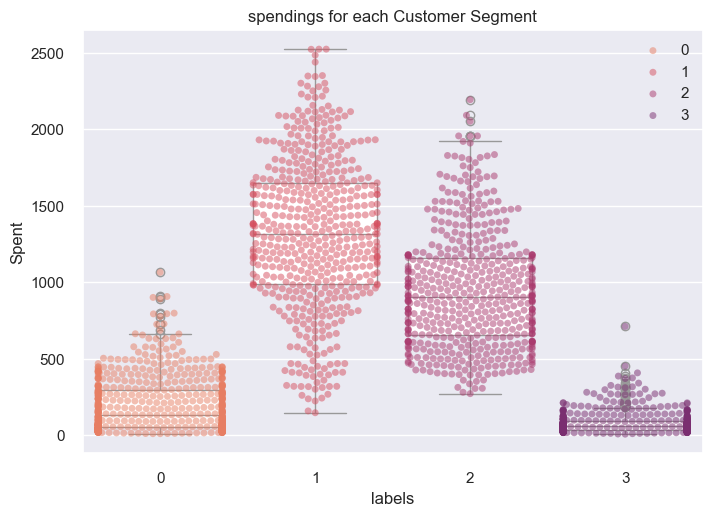

In [104]:
# plotting spendings for different customer segments 
# plot: swarm plots
sns.swarmplot(data=df_agglo, x='labels', y='Spent', palette='flare', alpha=0.5)
plt.legend([0,1,2,3])
sns.boxplot(data=df_agglo, x='labels', y='Spent',color='white')
plt.title('spendings for each Customer Segment')
plt.show()

## Observations on Customer Segments

- **Label 1**:  
  **Highest spending, majority of customers**

- **Label 3**:  
  **Lowest spending**

- **Label 2**:  
  **Average/high spending**

- **Label 0**:  
  **Low/average spending**

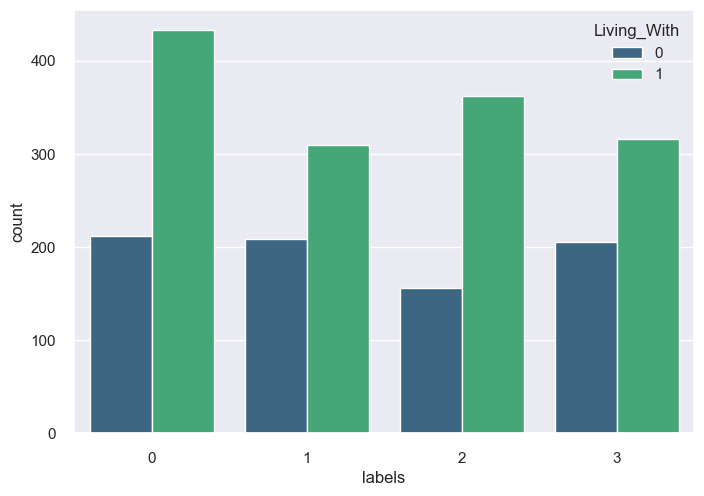

In [106]:
# Relationship status of customers in each segment
sns.countplot(data=df_agglo , x='labels', hue='Living_With', palette='viridis')
plt.show()

#### observation
- label 0, label 2 has majority of Single/alone as status

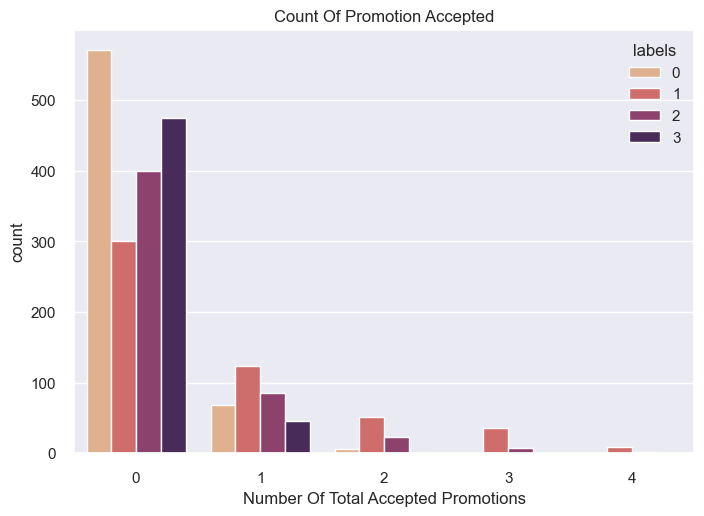

In [108]:
# promotions accepted for each Customer Segment
# feature to get a sum of accepted promotions 
df_agglo["Total_Promos"] = (df_agglo["AcceptedCmp1"]+ df_agglo["AcceptedCmp2"]+ 
                            df_agglo["AcceptedCmp3"]+ df_agglo["AcceptedCmp4"]+ 
                            df_agglo["AcceptedCmp5"])

plt.figure()
sns.countplot(x=df_agglo["Total_Promos"],hue=df_agglo['labels'], palette= 'flare')
plt.title("Count Of Promotion Accepted")
plt.xlabel("Number Of Total Accepted Promotions")
plt.show()

#### observation
- poor performances of targeted marketing campaigns

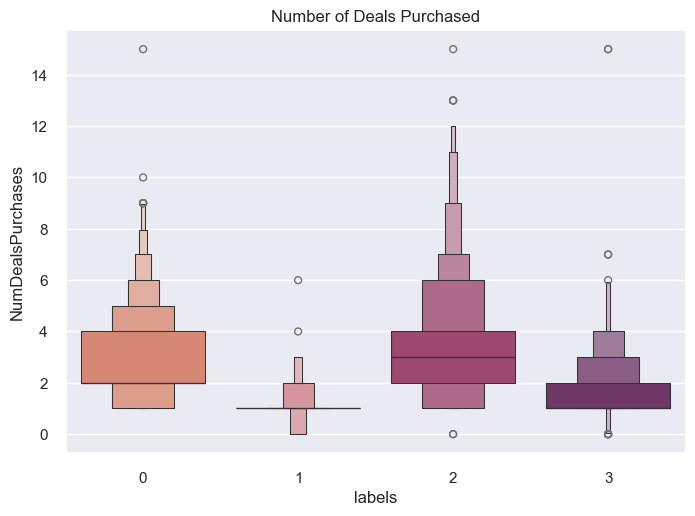

In [110]:
# number of deals purchased for each customer segment
plt.figure()
sns.boxenplot(y=df_agglo["NumDealsPurchases"],x=df_agglo['labels'], palette= 'flare')
plt.title("Number of Deals Purchased")
plt.show()

#### Observations

- **The deals offered performed well overall**
- **Best outcomes observed with Cluster 0 and Cluster 2**
- **Customers in Cluster 3 are less interested in the deals**
- **Nothing appears to attract Cluster 1 overwhelmingly**


## Customer segments Profiling

<Figure size 800x550 with 0 Axes>

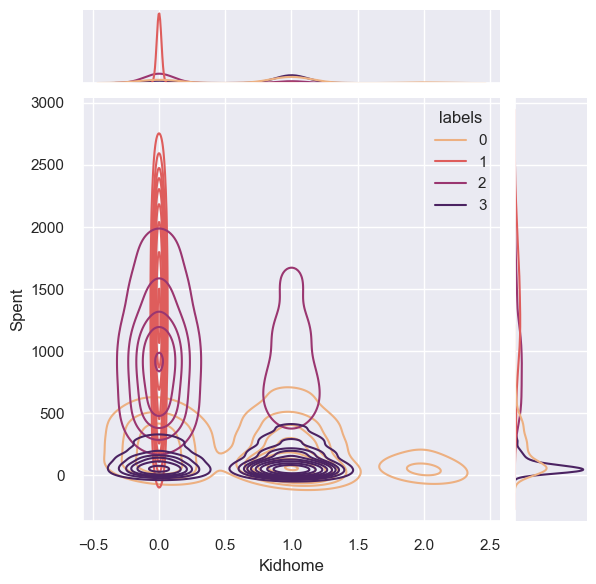

<Figure size 800x550 with 0 Axes>

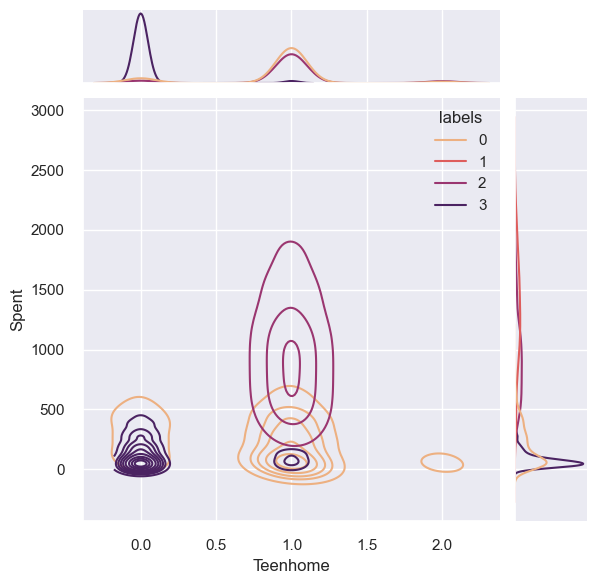

<Figure size 800x550 with 0 Axes>

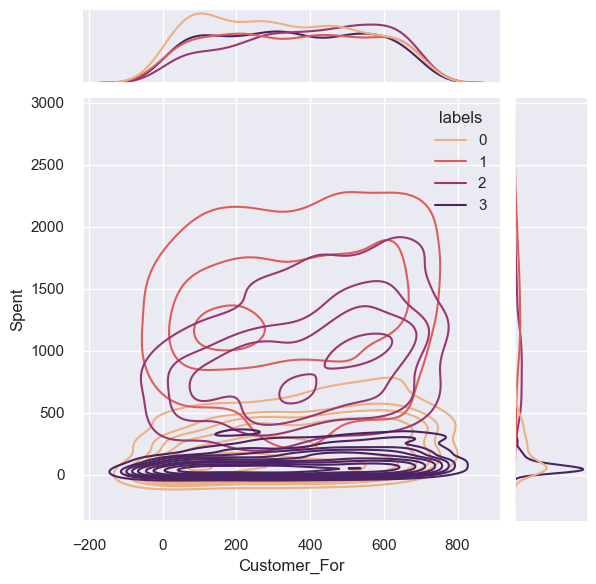

<Figure size 800x550 with 0 Axes>

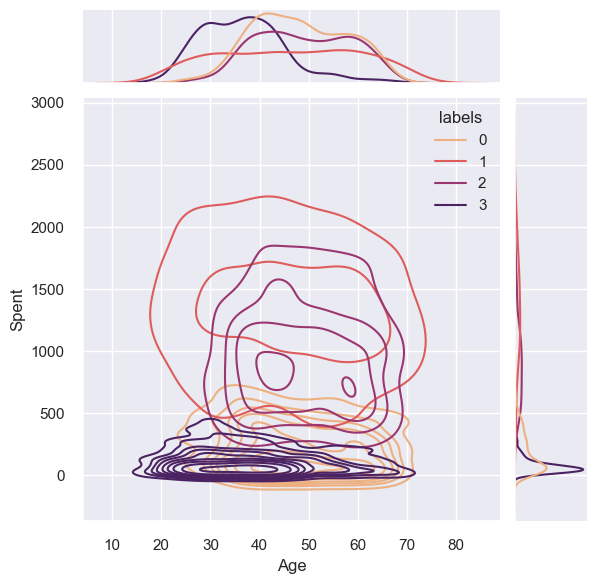

<Figure size 800x550 with 0 Axes>

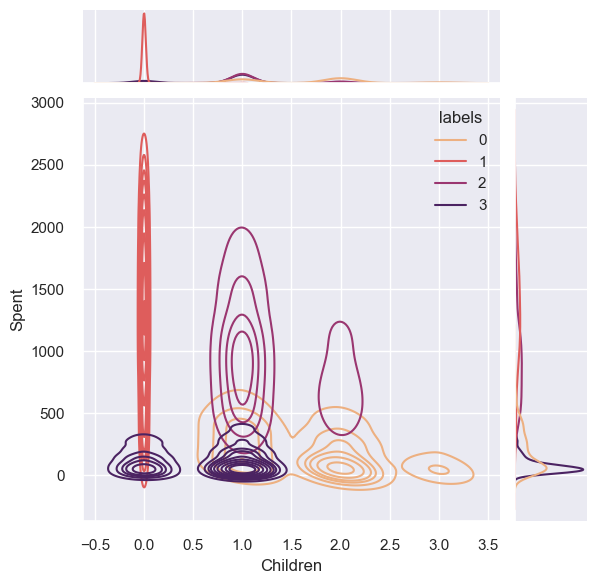

<Figure size 800x550 with 0 Axes>

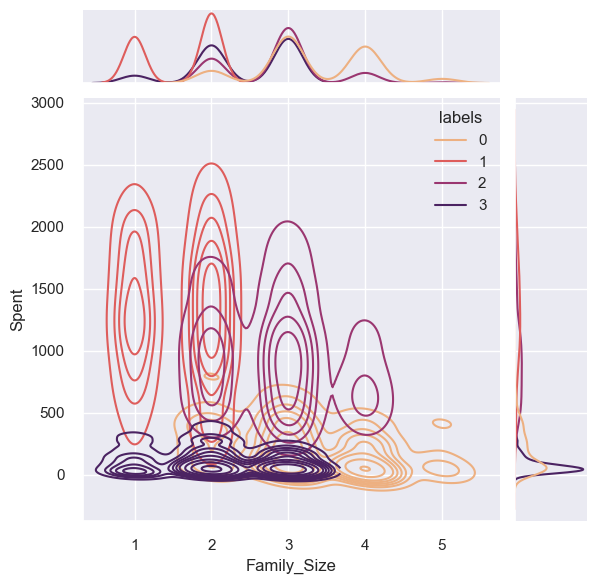

<Figure size 800x550 with 0 Axes>

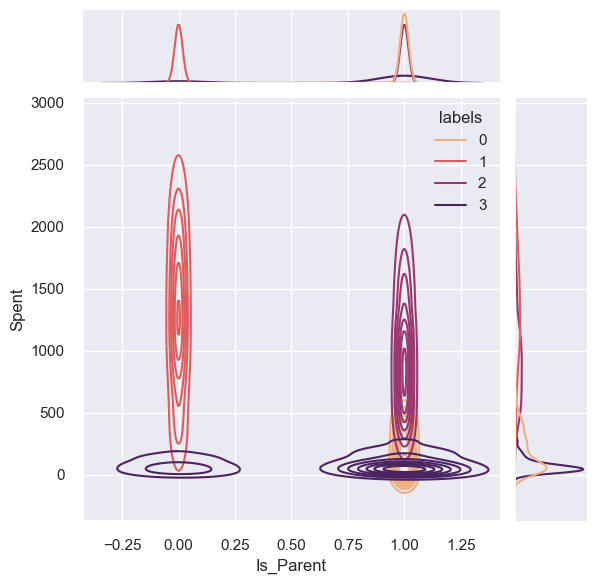

<Figure size 800x550 with 0 Axes>

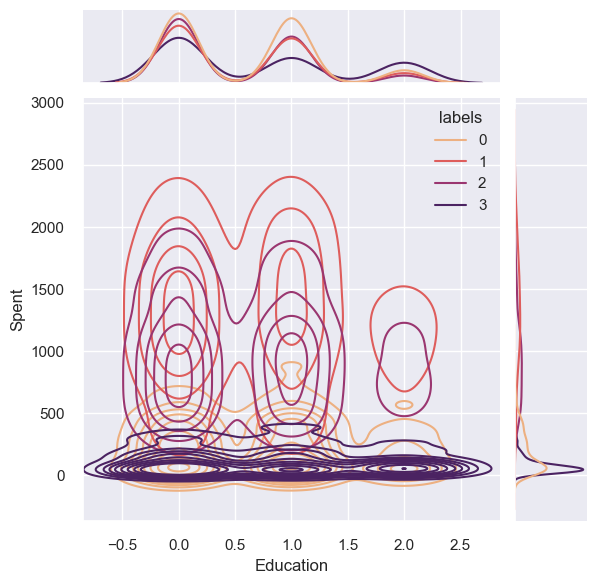

<Figure size 800x550 with 0 Axes>

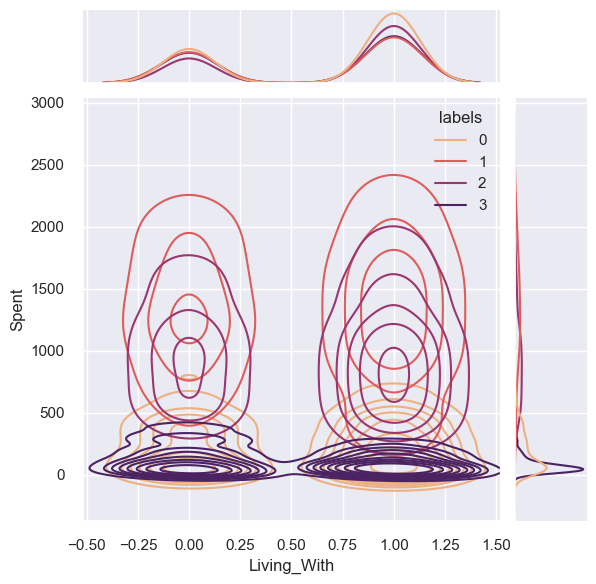

In [112]:
# profiling clusters based on customer attributes:
Personal = [ "Kidhome","Teenhome","Customer_For", "Age", "Children", "Family_Size", 
            "Is_Parent", "Education","Living_With"]

for i in Personal:
    plt.figure()
    sns.jointplot(x=df_agglo[i],y=df_agglo["Spent"],hue=df_agglo["labels"], kind="kde", palette='flare')
    plt.show()

## Observations on Customer Segments

- **Label 0**:  
  - **Low spending**  
  - **Parents** with teenagers at home  
  - **High age**, **average income**  
  - At least **2 children**, **family size > 3**  
  - Mostly **not postgraduates**  
  - Primarily **in a relationship**

- **Label 1**:  
  - **High spending**  
  - **No kids**, **no teenagers**, **no children**  
  - **Small family size (≤ 2)**  
  - **Spans all ages**  
  - **High income**

- **Label 2**:  
  - **Average/above average income**  
  - **1 or no kids**, **1 or no teenagers**  
  - **High age**, **1-2 children**  
  - **Family size < 4**  
  - **Parents**, mostly **in a relationship**

- **Label 3**:  
  - **Low income**  
  - **1 or no kid**, **no teenagers**  
  - **Relatively young**  
  - **1 or no children**  
  - **Family size < 4**


In [115]:
df_knowledge = df_agglo.groupby('labels').agg(['mean','median','max','min']).reset_index()
df_knowledge

labels Education                       Income                              \
              mean median max min          mean   median       max      min   
0      0  0.613953    1.0   2   0  43094.108527  43776.0   70844.0   4023.0   
1      1  0.576108    0.0   2   0  73317.223507  75345.0  105471.0  22507.0   
2      2  0.521236    0.0   2   0  64332.003861  63901.0   94871.0   4428.0   
3      3  0.725528    1.0   2   0  27906.374280  28072.0   52413.0   1730.0   

    Kidhome                 Teenhome                   Recency                 \
       mean median max min      mean median max min       mean median max min   
0  0.741085    1.0   2   0  0.916279    1.0   2   0  49.561240   50.0  99   0   
1  0.003854    0.0   1   0  0.000000    0.0   0   0  49.277457   52.0  99   0   
2  0.171815    0.0   2   0  0.986486    1.0   2   0  49.144788   50.0  99   0   
3  0.777351    1.0   2   0  0.028791    0.0   1   0  48.013436   47.0  99   0   

        Wines                      Fruits                        Meat         \
         mean median   max min       mean median  max min        mean median   
0  113.196899   62.0   896   1   5.251163    2.0   90   0   37.286822   23.0   
1  586.996146  556.0  1493   7  62.048170   45.0  197   0  440.687861  417.0   
2  549.779923  505.0  1492  16  37.928571   24.0  199   0  191.936293  161.5   
3   24.255278   11.0   342   0   5.717850    3.0   47   0   20.335893   13.0   

                 Fish                     Sweets                       Gold  \
   max min       mean median  max min       mean median  max min       mean   
0  235   1   7.863566    3.0  123   0   5.218605    2.0  103   0  22.823256   
1  984   7  91.618497   76.0  254   0  62.639692   48.0  198   0  73.978805   
2  864  12  51.442085   32.0  259   0  39.901544   24.0  195   0  70.146718   
3  230   0   7.642994    4.0  102   0   5.777351    3.0   78   0  14.760077   

                  NumDealsPurchases                NumWebPurchases             \
  median  max min              mean median max min            mean median max   
0   13.0  191   0          2.944186    2.0  15   1        3.141085    3.0  11   
1   53.0  249   0          1.073218    1.0   6   0        4.930636    5.0  11   
2   53.5  321   0          3.310811    3.0  15   0        6.563707    6.0  25   
3   10.0  262   0          1.777351    1.0  15   0        1.976967    2.0  10   

      NumCatalogPurchases                NumStorePurchases                 \
  min                mean median max min              mean median max min   
0   0            0.947287    1.0   6   0          4.043411    4.0  12   0   
1   1            5.585742    5.0  11   1          8.204239    8.0  13   3   
2   1            4.013514    4.0  11   0          8.563707    8.0  13   0   
3   0            0.414587    0.0   5   0          2.953935    3.0   7   0   

  NumWebVisitsMonth                AcceptedCmp3                AcceptedCmp4  \
               mean median max min         mean median max min         mean   
0          6.182946    6.0  20   1     0.060465    0.0   1   0     0.049612   
1          2.865125    2.0   9   0     0.080925    0.0   1   0     0.125241   
2          5.104247    5.0   9   0     0.071429    0.0   1   0     0.125483   
3          7.000000    7.0  20   2     0.086372    0.0   1   0     0.003839   

                 AcceptedCmp5                AcceptedCmp1                 \
  median max min         mean median max min         mean median max min   
0    0.0   1   0     0.000000    0.0   0   0     0.009302    0.0   1   0   
1    0.0   1   0     0.262042    0.0   1   0     0.208092    0.0   1   0   
2    0.0   1   0     0.048263    0.0   1   0     0.052124    0.0   1   0   
3    0.0   1   0     0.000000    0.0   0   0     0.001919    0.0   1   0   

  AcceptedCmp2                 Complain                 Response             \
          mean median max min      mean median max min      mean median max   
0     0.004651    0.0   1   0  0.009302    0

In [123]:
df_knowledge= df_knowledge[['Education','Income','Kidhome','Teenhome','NumDealsPurchases','Age','Spent','Living_With','Children','Family_Size'	]]

# Conclusion

- **Objective**: The project focused on customer personality analysis and segmentation to identify distinct customer groups, which can help in planning targeted marketing strategies.

- **Clustering Techniques**:
  - I experimented with multiple clustering algorithms, including K-Means, Agglomerative Clustering, and DBSCAN.
  - After evaluating the performance of each algorithm, I selected Agglomerative Clustering as the best method for this project.

- **Dimensionality Reduction**:
  - To improve the efficiency and interpretability of the clustering process, I applied dimensionality reduction techniques before performing the clustering.

- **Cluster Formation**:
  - The clustering analysis resulted in four distinct customer segments, each exhibiting unique characteristics.

- **Customer Profiling**:
  - I profiled customers within each cluster based on factors such as family structure, income, and spending habits.
  - These insights helped in formalizing the customer segments in alignment with business requirements.

- **Business Application**:
  - The segmented profiles can be leveraged for designing more effective marketing strategies, targeting specific customer groups based on their unique characteristics.


# Classification Prediction

In [117]:
df_agglo.head(1)

,Education,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Customer_For,Age,Spent,Living_With,Children,Family_Size,Is_Parent,labels,Total_Promos
0,0,58138.0,0,0,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,663,57,1617,0,0,1,0,1,0


In [118]:
df = df_agglo[['Education','Income','Kidhome','Teenhome','NumDealsPurchases','Age','Spent','Living_With','Children','Family_Size','Total_Promos','labels']]

In [119]:
df

,Education,Income,Kidhome,Teenhome,NumDealsPurchases,Age,Spent,Living_With,Children,Family_Size,Total_Promos,labels
0,0,58138.0,0,0,3,57,1617,0,0,1,0,1
1,0,46344.0,1,1,2,60,27,0,2,3,0,0
2,0,71613.0,0,0,1,49,776,1,0,2,0,1
3,0,26646.0,1,0,2,30,53,1,1,3,0,3
4,1,58293.0,1,0,5,33,422,1,1,3,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
2198,0,61223.0,0,1,2,47,1341,1,1,3,0,2
2199,1,64014.0,2,1,7,68,444,1,3,5,1,0
2200,0,56981.0,0,0,1,33,1241,0,0,1,1,1
2201,1,69245.0,0,1,2,58,843,1,1,3,0,2


In [120]:
X = df.drop('labels',axis=1)
X.head(1)

,Education,Income,Kidhome,Teenhome,NumDealsPurchases,Age,Spent,Living_With,Children,Family_Size,Total_Promos
0,0,58138.0,0,0,3,57,1617,0,0,1,0


In [121]:
y = df.labels
y

0       1
1       0
2       1
3       3
4       0
       ..
2198    2
2199    0
2200    1
2201    2
2202    0
Name: labels, Length: 2203, dtype: int64

In [122]:
# train-test spit
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

In [123]:
print(X_train.shape, X_test.shape, X.shape)

(1762, 11) (441, 11) (2203, 11)


## Random Forest Classifier

In [136]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Predict on the test set
y_pred = rf_model.predict(X_test)

In [137]:
# Accuracy
accuracy = accuracy_score(y_test, y_pred)

# Precision
precision = precision_score(y_test, y_pred, average='weighted')

# Recall
recall = recall_score(y_test, y_pred, average='weighted')

# F1 score
f1 = f1_score(y_test, y_pred, average='weighted')

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Classification Report (Precision, Recall, F1-score per class)
class_report = classification_report(y_test, y_pred)

# Print metrics
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")
print('********************************************')
print("Confusion Matrix:\n", conf_matrix)
print('********************************************')
print("Classification Report:\n", class_report)

Accuracy: 0.9455782312925171
Precision: 0.94565099139888
Recall: 0.9455782312925171
F1 Score: 0.9455853325120471
********************************************
Confusion Matrix:
 [[119   0   4   6]
 [  0 102   0   2]
 [  5   1  98   0]
 [  4   1   1  98]]
********************************************
Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.92      0.93       129
           1       0.98      0.98      0.98       104
           2       0.95      0.94      0.95       104
           3       0.92      0.94      0.93       104

    accuracy                           0.95       441
   macro avg       0.95      0.95      0.95       441
weighted avg       0.95      0.95      0.95       441



### Saving Model

In [138]:

# Save the model
joblib.dump(rf_model, 'random_forest_model.pkl')

['random_forest_model.pkl']

In [139]:
X.columns

Index(['Education', 'Income', 'Kidhome', 'Teenhome', 'NumDealsPurchases',
       'Age', 'Spent', 'Living_With', 'Children', 'Family_Size',
       'Total_Promos'],
      dtype='object')

In [126]:
# Save your DataFrames using joblib
joblib.dump(agglo_data, 'agglo_data.pkl')
joblib.dump(df_agglo, 'df_agglo.pkl')

['df_agglo.pkl']

In [124]:
# save df_knowledge
joblib.dump(df_knowledge,'df_knowledge.pkl')

['df_knowledge.pkl']